In [1]:
import pandas as pd
import os
# import datetime
# import psycopg2
import numpy as np
import math
# import plotly.express as px
# import plotly.graph_objects as go
# import plotly.figure_factory as ff
import re
import time
import matplotlib.pyplot as plt
%matplotlib inline
# from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)
# from matplotlib import dates
# import matplotlib.gridspec as gridspec
import seaborn as sns

In [2]:
def look_at_data(fluxes, ts_col, *cols):

    global units
    for k in range(0, fluxes.shape[0], 2000):
        
        part = fluxes.iloc[k:k+2000, :]
        
        if type(ts_col) == str:
            if ts_col == 'index':
                time_col = part.index
            else:
                time_col = part[ts_col]    
        else: 
            time_col = part.index
         
        if part[part[cols[0]].isna()].shape[0] == part[cols[0]].shape[0]:
            
            if type(ts_col) == str and ts_col != 'index':
                print(f'no data {part.loc[part.index[-1], ts_col]} - {part.loc[part.index[0], ts_col]}')
            else:
                
                print(f'no data {part.index[-1] - part.index[0]}')
            continue
        else:
            plt.figure(figsize=(20, 4))
            
                
            for fig_col in cols:
                if part.loc[part[fig_col] == -9999, fig_col].count() > 0:
                    part.loc[part[fig_col] == -9999, fig_col] = None

                plt.plot(time_col, part[fig_col], label = fig_col)
                    
            plt.xlabel('Date')
            plt.ylabel(f'{fig_col}, {units.loc["pic", fig_col]}')
            plt.title(f'{fig_col} data from {part[ts_col][0]} to {part[ts_col][-1]}')
            plt.grid()
            plt.legend()
            plt.autoscale(enable=None, axis="x", tight=True)
            plt.show()


In [3]:
def despike(fluxes, ts, col, interval_days=20,  std=1.5):
    print('------------------')
    print(f'Despike {col}:')
    print(f'number of null values: {fluxes[col].isna().sum()}, {(fluxes[col].isna().sum() / fluxes[col].shape[0])* 100} % ')
    print(f'number of null values: {fluxes[col].notna().sum()}, {(fluxes[col].notna().sum() / fluxes[col].shape[0])*100} % ')
    daily_aver_col = f'daily_aver_{col}'
    for i in range(48):

        tss = fluxes.index[i::48]
        df = fluxes.loc[tss, [ts, col]]
        
        df[daily_aver_col] = df[col].rolling(interval_days*2+1, min_periods=1, center=True).mean()
        fluxes.loc[tss, daily_aver_col] = df[daily_aver_col]
        units[daily_aver_col] = units[col]
        
    resid_col = f'resid_{col}'
    fluxes[resid_col] = fluxes[col] - fluxes[daily_aver_col]
    units[resid_col] = units[col]
    std_col = f'{col}_std'
    for i in range(48):

        tss = sorted(list(fluxes.index[i::48]) + list(fluxes.index[i+47::48]) + list(fluxes.index[i+1::48]))
        df = fluxes.loc[tss, [ts, resid_col]]
        
        df[std_col] = df[resid_col].rolling(interval_days*4+1, min_periods=1, center=True).std()
        fluxes.loc[tss, std_col] = df[std_col]
    # fluxes[std_col] = (fluxes[resid_col]).rolling(interval_days * 48 +1, min_periods=1, center=True).std()
    units[std_col] = units[col]
    resid_max_col = f'resid_max_{col}'
    resid_min_col = f'resid_min_{col}'
    
    fluxes[resid_max_col] = std * fluxes[std_col]
    fluxes[resid_min_col] =  - std * fluxes[std_col]
    units[resid_max_col] = units[col]
    units[resid_min_col] = units[col]
    despike_col = f'{col}_2'
    units[despike_col] = units[col]
    fluxes[despike_col] = fluxes[col]
    spike_amount = fluxes[(fluxes[resid_col] > fluxes[resid_max_col]) | (fluxes[resid_col] < fluxes[resid_min_col])].shape[0]
    total = fluxes[col].notna().sum()
    print(f'Column {col} has {spike_amount} spikes ({spike_amount/total * 100}%) from total {total} records')
    
    for k in range(0, fluxes.shape[0], 2000):
        plt.figure(figsize=(20, 4), layout="constrained")
        part = fluxes.iloc[k:k+2000, :]
        for fig_col in [resid_col, resid_max_col, resid_min_col]:
            plt.plot(part[ts], part[fig_col], label=fig_col)
        plt.grid()
        plt.legend()
        plt.xlabel('Date')
        plt.ylabel(f'{col}, {units.loc["pic", fig_col]}')
        plt.title(f'{col} residuals from {part[ts][0]} to {part[ts][-1]}')
        plt.autoscale(enable=None, axis="x", tight=True)
    plt.show()
    print()
    print(f'Data {col} with discarded outliers:')
    discard_mask = (fluxes[resid_col] > fluxes[resid_max_col]) | (fluxes[resid_col] < fluxes[resid_min_col])
    fluxes.loc[discard_mask, despike_col] = None
    
    for k in range(0, fluxes.shape[0], 2000):
        plt.figure(figsize=(20, 4), layout="constrained")
        part = fluxes.iloc[k:k+2000, :]
        for fig_col in [col, daily_aver_col, despike_col]:
            plt.plot(part[ts], part[fig_col], label = fig_col)
        # plt.plot(part[ts], part[daily_aver_col]+ std* part[std_col], '--', label = 'upper boundary')
        # plt.plot(part[ts], part[daily_aver_col]- std* part[std_col], '--', label = 'lower boundary')
        plt.fill_between(part[ts], part[daily_aver_col]- std* part[std_col], part[daily_aver_col]+ std* part[std_col], color='grey', alpha=0.2)
        plt.legend()
        plt.grid()
        plt.xlabel('Date')
        plt.ylabel(f'{col}, {units.loc["pic", fig_col]}')
        plt.title(f'{col} data from {part[ts][0]} to {part[ts][-1]}')
        plt.autoscale(enable=None, axis="x", tight=True)

        plt.show()
    print('--------------------------')
    print()



In [4]:
def foo(args):

    center = (len(args))//2
    res = args[center]

    if (pd.notna(args[0])) and (pd.notna(args[-1])):
        if len(args) == 3 and pd.isna(args[1]):
            res = sum([args[0], args[-1]])/ 2
                
        if len(args) == 4:

            if pd.isna(args[1]) and pd.isna(args[2]):
                res = (args[0] + 2* args[-1]) / 3
    
    return res

def fillna_1_2_gap(df, ts_col, col):
    print('Filling the gaps with size 1-2 values by linear trend:')
    if col[-2:] == '_2':
        next_step = col[:-2] + '_3'

    else:
        next_step = col + '_3'

    df[next_step] = df[col].rolling(4, min_periods=1, center=True).apply(lambda x: foo(x), raw=True)

    df[next_step] = df[next_step].rolling(3, min_periods=1, center=True).apply(lambda x: foo(x), raw=True)
    units[next_step] = units[col]
    # look_at_data(df, ts_col, col, next_step)
    print(f'Number of values filled: {df[col].isna().sum() - df[next_step].isna().sum()}')
    print('--------------------------------')
    print()



In [5]:
def daily_aver(df, ts_col, col, interval_days):
    print('Fill the gaps with daily average trend')
    daily_aver_col = f'daily_aver_{col}_cleaned'
    for i in range(48):

        tss = df.index[i::48]
        part = df.loc[tss, [ts_col, col]]
        
        part[daily_aver_col] = part[col].rolling(interval_days*2+1, min_periods=1, center=True).mean()
        df.loc[tss, daily_aver_col] = part[daily_aver_col]
    
    if col[-2:] == '_3':
        filled_col = col[:-2] + '_f'
    df[filled_col] = df[col].fillna(df[daily_aver_col])
    
    units[daily_aver_col] = units[col]
    units[filled_col] = units[col]
    look_at_data(df, ts_col, col, daily_aver_col, filled_col)
    
    print(f'Number of filled values on this step: {df[col].isna().sum() - df[filled_col].isna().sum()}')
    print(f'Number of nan values on this step: {df[filled_col].isna().sum()}, {df[filled_col].isna().sum()/ df[col].shape[0] * 100}%')
    print('----------------------------')
    print('----------------------------')
    print()

In [6]:
def make_good_data(df, time_col):

    qc_cols = [x for x in df if 'qc_' in x]
    flux_cols = [x[3:] for x in qc_cols]

    for col in flux_cols:
        df[col + '_qual'] = df[col]
        df.loc[df['qc_' + col]==2, col + '_qual'] = None
        units[col + '_qual'] = units[col]
    
    df['NEE'] = df['co2_flux_qual'] + df['co2_strg']
    units['NEE'] = units['co2_flux']
    for col in ['NEE', 'H_qual', 'LE_qual']:
        despike(df, time_col, col, interval_days=20,  std=1.5)
        fillna_1_2_gap(df, time_col, col+'_2')
        daily_aver(df, time_col, col+'_3', 20)

In [7]:
def first_clean(df, col, n_sigma=3):
    cleaned_col = col+'_cleaned'

    #  df[col].hist(bins=200)
    col_mean =df[col].mean()
    col_std = df[col].std()

    df[cleaned_col] = df[col][(df[col] > col_mean - n_sigma* col_std) & (df[col] < col_mean + n_sigma* col_std)]
    look_at_data(df, 'ts', col, cleaned_col)
    print('Number of discarted values: ', df[col].count() - df[cleaned_col].count())


In [8]:
folder = r"D:\KCR\eddy_pro_2"
dirs = [os.path.join(folder, f) for f in os.listdir(folder)]

dirs

['D:\\KCR\\eddy_pro_2\\KCR_eddypro_2022-06-12--2022-12-01-05',
 'D:\\KCR\\eddy_pro_2\\KCR_eddypro_2022-06-12--2022-12-01-06',
 'D:\\KCR\\eddy_pro_2\\KCR_eddypro_2023-02-24--2023-06-25__4',
 'D:\\KCR\\eddy_pro_2\\KCR_eddypro_2023-06-24--2023-11-15_3']

In [27]:

full_outputs = [os.path.join(path, list(filter(lambda x: '_full_output_' in x, os.listdir(path)))[0]) for path in dirs if len(list(filter(lambda x: '_full_output_' in x, os.listdir(path)))) > 0]
full_outputs

['D:\\KCR\\eddy_pro_2\\KCR_eddypro_2023-02-24--2023-06-25__4\\eddypro_KCR_8__full_output_2024-01-17T013342_adv.csv',
 'D:\\KCR\\eddy_pro_2\\KCR_eddypro_2023-06-24--2023-11-15_3\\eddypro_KCR_8__full_output_2024-01-16T094204_adv.csv']

In [28]:
biomets = [os.path.join(path, list(filter(lambda x:  '_biomet_' in x, os.listdir(path)))[0]) for path in dirs if len(list(filter(lambda x: '_biomet_' in x, os.listdir(path)))) > 0]
biomets

['D:\\KCR\\eddy_pro_2\\KCR_eddypro_2023-02-24--2023-06-25__4\\eddypro_KCR_8__biomet_2024-01-16T122348_adv.csv',
 'D:\\KCR\\eddy_pro_2\\KCR_eddypro_2023-06-24--2023-11-15_3\\eddypro_KCR_8__biomet_2024-01-15T171622_adv.csv']

In [29]:

def make_df(path):
    df = pd.read_csv(path, na_values=-9999, skiprows=[0, 2])

    print(df.shape)
    print(df.isna().sum())
    df.index = pd.to_datetime(df['date'] + ' ' + df['time'])
    beginning = df.index[0]
    ending = df.index[-1]
    print(f'start: {beginning}, end: {ending}')
    # df = df.dropna(how='all', axis=1)
    # df = df.dropna(thresh=10, axis=0)
    print(f'df size after nan drop: {df.shape}')
    print('--------------------------')
    return {'df': df, 'beginning': beginning, 'ending': ending}

In [30]:
datas = []
for path in full_outputs:
    datas.append(make_df(path))

(5808, 193)
filename                            0
date                                0
time                                0
DOY                                 0
daytime                            44
                                   ..
h2o_signal_strength_7200_mean      44
delta_signal_strength_7200_mean    44
flowrate_mean                      44
hit_power_mean                     44
hit_vin_mean                       44
Length: 193, dtype: int64
start: 2023-02-24 00:30:00, end: 2023-06-25 00:00:00
df size after nan drop: (5808, 193)
--------------------------
(7342, 193)
filename                            0
date                                0
time                                0
DOY                                 0
daytime                            23
                                   ..
h2o_signal_strength_7200_mean      23
delta_signal_strength_7200_mean    23
flowrate_mean                      23
hit_power_mean                     23
hit_vin_mean                       2

In [31]:
datas.sort(key = lambda x: x['beginning'])

beginnings = [data['beginning'] for data in datas]
endings = [data['ending'] for data in datas]
gaps = [ beginnings[i+1] - endings[i] for i in range(len(endings)-1)]
gaps

[Timedelta('-9 days +00:30:00')]

In [32]:
overlap_indexes = []
for i, gap in enumerate(gaps):
    if gap < pd.Timedelta('00:00:00'):
        print(gap, i)
        overlap_indexes.append(i)
        

-9 days +00:30:00 0


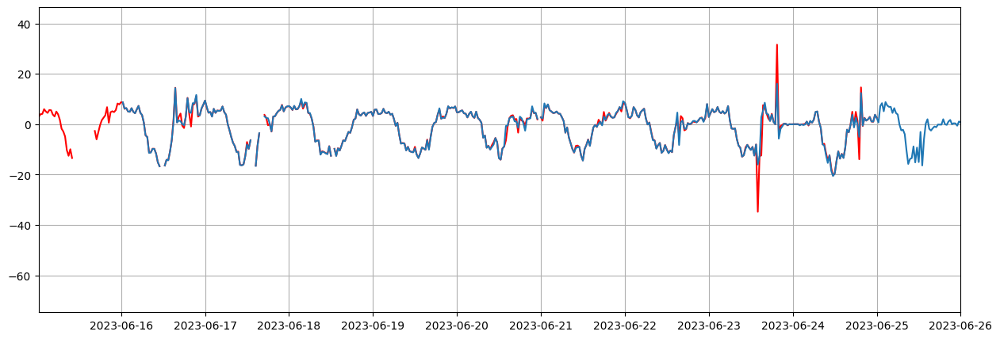

In [33]:
for over_indx in overlap_indexes:
    plt.figure(figsize=(15, 5))
    plt.plot(datas[over_indx]['df'].index, datas[over_indx]['df']['co2_flux'], 'r')
    plt.plot(datas[over_indx + 1]['df'].index, datas[over_indx + 1]['df']['co2_flux'])
    plt.xlim(beginnings[over_indx + 1]  - pd.Timedelta('1days'),  endings[over_indx] + pd.Timedelta('1days'))
    plt.grid()

In [34]:
edges = [pd.to_datetime('2023-06-16 02:00')]

In [35]:
cuts = [pd.Timedelta('0days') if i in overlap_indexes else pd.Timedelta('0days')]

edge_it = iter(edges)
concat_limits = []

beg = [beginnings[0]]
ends = []
for i in range(len(endings)-1):
    
    if i in overlap_indexes:
        q = next(edge_it)

        ends.append(q)

        beg.append(q + pd.Timedelta('30min'))

    else:
        ends.append(endings[i])
        beg.append(beginnings[i+1] )

ends.append(endings[-1])
concat_limits = list(zip(beg, ends))
concat_limits

[(Timestamp('2023-02-24 00:30:00'), Timestamp('2023-06-16 02:00:00')),
 (Timestamp('2023-06-16 02:30:00'), Timestamp('2023-11-15 23:00:00'))]

In [36]:
df = pd.concat([datas[i]['df'].loc[concat_limits[i][0]: concat_limits[i][1], :] for i in range(len(datas))])
df

,filename,date,time,DOY,daytime,file_records,used_records,Tau,qc_Tau,rand_err_Tau,...,co2_mean.1,h2o_mean.1,dew_point_mean,avg_signal_strength_7200_mean,co2_signal_strength_7200_mean,h2o_signal_strength_7200_mean,delta_signal_strength_7200_mean,flowrate_mean,hit_power_mean,hit_vin_mean
2023-02-24 00:30:00,2023-02-24T000000_KTR-AIU-2334.ghg,2023-02-24,00:30,55.020,0.0,18000.0,18000.0,-0.167290,1.0,0.024898,...,412.292,17.7049,13.7185,101.090,101.425,100.755,0.670069,0.000200,3.0,23.3581
2023-02-24 01:00:00,2023-02-24T003000_KTR-AIU-2334.ghg,2023-02-24,01:00,55.041,0.0,18000.0,18000.0,-0.042600,0.0,0.005971,...,412.554,17.4011,13.4502,101.080,101.400,100.760,0.639282,0.000200,3.0,23.3355
2023-02-24 01:30:00,2023-02-24T010000_KTR-AIU-2334.ghg,2023-02-24,01:30,55.062,0.0,18000.0,18000.0,-0.172975,0.0,0.029745,...,412.964,17.3150,13.3709,101.092,101.415,100.768,0.647663,0.000199,3.0,23.3091
2023-02-24 02:00:00,2023-02-24T013000_KTR-AIU-2334.ghg,2023-02-24,02:00,55.083,0.0,18000.0,18000.0,-0.085059,0.0,0.012847,...,413.288,17.2419,13.3029,101.092,101.410,100.775,0.635093,0.000199,3.0,23.2897
2023-02-24 02:30:00,2023-02-24T020000_KTR-AIU-2334.ghg,2023-02-24,02:30,55.104,0.0,18000.0,18000.0,-0.041798,1.0,0.010875,...,414.635,16.9223,13.0110,101.097,101.403,100.790,0.612999,0.000200,3.0,23.2438
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-15 21:00:00,2023-11-15T203000_KTR-AIU-2334.ghg,2023-11-15,21:00,319.875,0.0,18000.0,18000.0,-0.142330,1.0,0.017372,...,415.092,24.2582,18.6939,101.580,102.298,100.863,1.434780,0.000202,-1.0,0.0000
2023-11-15 21:30:00,2023-11-15T210000_KTR-AIU-2334.ghg,2023-11-15,21:30,319.896,0.0,18000.0,18000.0,-0.146318,1.0,0.023970,...,415.365,24.3297,18.7436,101.578,102.298,100.858,1.439410,0.000202,-1.0,0.0000
2023-11-15 22:00:00,2023-11-15T213000_KTR-AIU-2334.ghg,2023-11-15,22:00,319.917,0.0,18000.0,18000.0,-0.202384,1.0,0.035250,...,415.287,24.3277,18.7431,101.578,102.296,100.859,1.437150,0.000202,-1.0,0.0000
2023-11-15 22:30:00,2023-11-15T220000_KTR-AIU-2334.ghg,2023-11-15,22:30,319.937,0.0,18000.0,18000.0,-0.335074,0.0,0.039662,...,415.882,24.3531,18.7595,101.574,102.293,100.856,1.437160,0.000203,-1.0,0.0000


In [37]:
null_cols = []
for col in df.columns:
    if df[col].isna().sum() == df.shape[0]:
        null_cols.append(col)

null_cols


['ch4_flux',
 'qc_ch4_flux',
 'rand_err_ch4_flux',
 'none_flux',
 'qc_none_flux',
 'rand_err_none_flux',
 'ch4_strg',
 'none_strg',
 'ch4_v-adv',
 'none_v-adv',
 'ch4_molar_density',
 'ch4_mole_fraction',
 'ch4_mixing_ratio',
 'ch4_time_lag',
 'none_molar_density',
 'none_mole_fraction',
 'none_mixing_ratio',
 'none_time_lag',
 'pitch',
 'roll',
 'un_ch4_flux',
 'ch4_scf',
 'un_none_flux',
 'un_none_scf',
 'ch4_spikes',
 'none_spikes',
 'chopper_LI-7500',
 'detector_LI-7500',
 'pll_LI-7500',
 'sync_LI-7500',
 'not_ready_LI-7700',
 'no_signal_LI-7700',
 're_unlocked_LI-7700',
 'bad_temp_LI-7700',
 'laser_temp_unregulated_LI-7700',
 'block_temp_unregulated_LI-7700',
 'motor_spinning_LI-7700',
 'pump_on_LI-7700',
 'top_heater_on_LI-7700',
 'bottom_heater_on_LI-7700',
 'calibrating_LI-7700',
 'motor_failure_LI-7700',
 'bad_aux_tc1_LI-7700',
 'bad_aux_tc2_LI-7700',
 'bad_aux_tc3_LI-7700',
 'box_connected_LI-7700',
 'mean_value_LI-7500',
 'ch4_var',
 'none_var',
 'w/ch4_cov',
 'w/none_cov']

In [38]:
df.dropna(how='all', axis=1, inplace=True)
df.shape

(12718, 142)

In [39]:
list(df.columns)

['filename',
 'date',
 'time',
 'DOY',
 'daytime',
 'file_records',
 'used_records',
 'Tau',
 'qc_Tau',
 'rand_err_Tau',
 'H',
 'qc_H',
 'rand_err_H',
 'LE',
 'qc_LE',
 'rand_err_LE',
 'co2_flux',
 'qc_co2_flux',
 'rand_err_co2_flux',
 'h2o_flux',
 'qc_h2o_flux',
 'rand_err_h2o_flux',
 'H_strg',
 'LE_strg',
 'co2_strg',
 'h2o_strg',
 'co2_v-adv',
 'h2o_v-adv',
 'co2_molar_density',
 'co2_mole_fraction',
 'co2_mixing_ratio',
 'co2_time_lag',
 'co2_def_timelag',
 'h2o_molar_density',
 'h2o_mole_fraction',
 'h2o_mixing_ratio',
 'h2o_time_lag',
 'h2o_def_timelag',
 'ch4_def_timelag',
 'none_def_timelag',
 'sonic_temperature',
 'air_temperature',
 'air_pressure',
 'air_density',
 'air_heat_capacity',
 'air_molar_volume',
 'ET',
 'water_vapor_density',
 'e',
 'es',
 'specific_humidity',
 'RH',
 'VPD',
 'Tdew',
 'u_unrot',
 'v_unrot',
 'w_unrot',
 'u_rot',
 'v_rot',
 'w_rot',
 'wind_speed',
 'max_wind_speed',
 'wind_dir',
 'yaw',
 'u*',
 'TKE',
 'L',
 '(z-d)/L',
 'bowen_ratio',
 'T*',
 'model

In [40]:
df_units = pd.read_csv(full_outputs[0], skiprows=1, nrows=1)
df_units


,filename,date,time,DOY,daytime,file_records,used_records,Tau,qc_Tau,rand_err_Tau,...,co2_mean.1,h2o_mean.1,dew_point_mean,avg_signal_strength_7200_mean,co2_signal_strength_7200_mean,h2o_signal_strength_7200_mean,delta_signal_strength_7200_mean,flowrate_mean,hit_power_mean,hit_vin_mean
0,NaN,[yyyy-mm-dd],[HH:MM],[ddd.ddd],[1=daytime],[#],[#],[kg+1m-1s-2],[#],[kg+1m-1s-2],...,--,--,--,--,--,--,--,--,--,--


In [41]:
df_units.drop(null_cols, axis=1, inplace=True)
df_units.shape

(1, 142)

In [42]:
# df.to_csv('KCR_eddypro_data2.csv')

In [43]:

def make_bio(path):
    df = pd.read_csv(path, na_values=-9999, skiprows=[1])

    print(df.shape)
    print(df.isna().sum())
    df.index = pd.to_datetime(df['date'] + ' ' + df['time'])
    beginning = df.index[0]
    ending = df.index[-1]
    print(f'start: {beginning}, end: {ending}')
    # df = df.dropna(how='all', axis=1)
    # df = df.dropna(thresh=10, axis=0)
    print(f'df size after nan drop: {df.shape}')
    print('--------------------------')
    return {'df': df, 'beginning': beginning, 'ending': ending}

In [44]:
bios = []
for path in biomets:
    bios.append(make_bio(path))

(5808, 26)
date              0
time              0
DOY               0
CHK__1_1_1       21
DAQM_T_1_1_1     21
VIN_1_1_1        21
PPFD_1_1_1       21
P_RAIN_1_1_1     21
RG_1_1_1         21
RH_1_1_1         21
RH_2_1_1         21
RN_1_1_1         21
SHFSENS_1_1_1    21
SHFSENS_2_1_1    21
SHFSENS_3_1_1    21
SHF_1_1_1        21
SHF_2_1_1        21
SHF_3_1_1        21
SWC_1_1_1        21
SWC_2_1_1        21
SWC_3_1_1        21
TA_1_1_1         21
TA_2_1_1         21
TS_1_1_1         21
TS_2_1_1         21
TS_3_1_1         21
dtype: int64
start: 2023-02-24 00:30:00, end: 2023-06-25 00:00:00
df size after nan drop: (5808, 26)
--------------------------
(7342, 26)
date             0
time             0
DOY              0
CHK__1_1_1       5
DAQM_T_1_1_1     5
VIN_1_1_1        5
PPFD_1_1_1       5
P_RAIN_1_1_1     5
RG_1_1_1         5
RH_1_1_1         5
RH_2_1_1         5
RN_1_1_1         5
SHFSENS_1_1_1    5
SHFSENS_2_1_1    5
SHFSENS_3_1_1    5
SHF_1_1_1        5
SHF_2_1_1        5
SHF_3_1

In [45]:
bio  = pd.concat([bios[i]['df'].loc[concat_limits[i][0]: concat_limits[i][1], :] for i in range(len(biomets))])
bio

,date,time,DOY,CHK__1_1_1,DAQM_T_1_1_1,VIN_1_1_1,PPFD_1_1_1,P_RAIN_1_1_1,RG_1_1_1,RH_1_1_1,...,SHF_2_1_1,SHF_3_1_1,SWC_1_1_1,SWC_2_1_1,SWC_3_1_1,TA_1_1_1,TA_2_1_1,TS_1_1_1,TS_2_1_1,TS_3_1_1
2023-02-24 00:30:00,2023-02-24,00:30,55.0208,165.900,20.1750,12.2580,-0.036277,0.0000,-0.000212,100.412,...,-3.923150,-3.882110,0.291733,0.283000,0.338000,288.138,287.864,290.463,290.45,290.45
2023-02-24 01:00:00,2023-02-24,01:00,55.0416,124.000,20.1039,12.2659,-0.038537,0.0000,-0.000246,100.407,...,-4.076990,-4.122730,0.291200,0.283000,0.338000,287.863,287.625,290.450,290.45,290.45
2023-02-24 01:30:00,2023-02-24,01:30,55.0624,122.867,19.9646,12.2659,-0.041399,0.0000,-0.000205,100.398,...,-4.281020,-4.466650,0.289867,0.282733,0.336933,287.786,287.522,290.450,290.45,290.45
2023-02-24 02:00:00,2023-02-24,02:00,55.0833,148.833,19.8589,12.2655,-0.042665,0.0000,-0.000389,100.403,...,-4.427080,-4.640880,0.288400,0.281000,0.336000,287.649,287.465,290.450,290.45,290.45
2023-02-24 02:30:00,2023-02-24,02:30,55.1041,165.233,19.7365,12.2656,-0.043716,0.0000,-0.000192,100.401,...,-4.569160,-4.794040,0.286933,0.281000,0.336000,287.411,287.194,290.407,290.43,290.44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-15 21:00:00,2023-11-15,21:00,319.8748,139.567,25.2292,12.2666,-0.036332,0.0000,-0.001040,100.400,...,-0.468474,-0.425436,0.409700,0.297800,0.337000,293.465,293.279,294.250,294.45,294.45
2023-11-15 21:30:00,2023-11-15,21:30,319.8956,138.633,25.2143,12.2668,-0.037644,0.0000,-0.001216,100.415,...,-0.564025,-0.546018,0.401733,0.297933,0.337000,293.498,293.313,294.250,294.45,294.45
2023-11-15 22:00:00,2023-11-15,22:00,319.9165,142.033,25.2003,12.2667,-0.038822,0.0004,-0.001252,100.409,...,-0.651455,-0.659070,0.400000,0.297533,0.337333,293.505,293.313,294.250,294.45,294.45
2023-11-15 22:30:00,2023-11-15,22:30,319.9373,154.600,25.1583,12.2668,-0.039595,0.0000,-0.001146,100.396,...,-0.726943,-0.757234,0.403567,0.302900,0.341100,293.486,293.331,294.243,294.45,294.45


In [46]:
list(bio.columns)

['date',
 'time',
 'DOY',
 'CHK__1_1_1',
 'DAQM_T_1_1_1',
 'VIN_1_1_1',
 'PPFD_1_1_1',
 'P_RAIN_1_1_1',
 'RG_1_1_1',
 'RH_1_1_1',
 'RH_2_1_1',
 'RN_1_1_1',
 'SHFSENS_1_1_1',
 'SHFSENS_2_1_1',
 'SHFSENS_3_1_1',
 'SHF_1_1_1',
 'SHF_2_1_1',
 'SHF_3_1_1',
 'SWC_1_1_1',
 'SWC_2_1_1',
 'SWC_3_1_1',
 'TA_1_1_1',
 'TA_2_1_1',
 'TS_1_1_1',
 'TS_2_1_1',
 'TS_3_1_1']

In [47]:
bio_units = pd.read_csv(biomets[0], nrows=1)
bio_units

,date,time,DOY,CHK__1_1_1,DAQM_T_1_1_1,VIN_1_1_1,PPFD_1_1_1,P_RAIN_1_1_1,RG_1_1_1,RH_1_1_1,...,SHF_2_1_1,SHF_3_1_1,SWC_1_1_1,SWC_2_1_1,SWC_3_1_1,TA_1_1_1,TA_2_1_1,TS_1_1_1,TS_2_1_1,TS_3_1_1
0,[yyyy-mm-dd],[HH:MM],[ddd.ddd],[OTHER],[C],[V],[µmol/m^2/s],[m],[W/m^2],[%],...,[W/m^2],[W/m^2],[m^3/m^3],[m^3/m^3],[m^3/m^3],[K],[K],[K],[K],[K]


In [48]:
units = pd.concat([df_units, bio_units.iloc[:, 3:]], axis=1)
units

,filename,date,time,DOY,daytime,file_records,used_records,Tau,qc_Tau,rand_err_Tau,...,SHF_2_1_1,SHF_3_1_1,SWC_1_1_1,SWC_2_1_1,SWC_3_1_1,TA_1_1_1,TA_2_1_1,TS_1_1_1,TS_2_1_1,TS_3_1_1
0,NaN,[yyyy-mm-dd],[HH:MM],[ddd.ddd],[1=daytime],[#],[#],[kg+1m-1s-2],[#],[kg+1m-1s-2],...,[W/m^2],[W/m^2],[m^3/m^3],[m^3/m^3],[m^3/m^3],[K],[K],[K],[K],[K]


### format units for figures labels

In [49]:

for col in units.columns[1:]:
    units.loc[2, col] = re.findall('\[(.+)\]', units.loc[0, col])[0] if '[' in units.loc[0, col] else units.loc[0, col]
    print(units.loc[2, col])


yyyy-mm-dd
HH:MM
ddd.ddd
1=daytime
#
#
kg+1m-1s-2
#
kg+1m-1s-2
W+1m-2
#
W+1m-2
W+1m-2
#
W+1m-2
µmol+1s-1m-2
#
µmol+1s-1m-2
mmol+1s-1m-2
#
mmol+1s-1m-2
W+1m-2
W+1m-2
µmol+1s-1m-2
mmol+1s-1m-2
µmol+1s-1m-2
mmol+1s-1m-2
mmol+1m-3
µmol+1mol_a-1
µmol+1mol_d-1
s
1=default
mmol+1m-3
mmol+1mol_a-1
mmol+1mol_d-1
s
1=default
1=default
1=default
K
K
Pa
kg+1m-3
J+1kg-1K-1
m+3mol-1
mm+1hour-1
kg+1m-3
Pa
Pa
kg+1kg-1
%
Pa
K
m+1s-1
m+1s-1
m+1s-1
m+1s-1
m+1s-1
m+1s-1
m+1s-1
m+1s-1
deg_from_north
deg
m+1s-1
m+2s-2
m
#
#
K
0=KJ/1=KM/2=HS
m
m
m
m
m
m
m
kg+1m-1s-2
#
W+1m-2
#
W+1m-2
#
µmol+1s-1m-2
#
mmol+1s-1m-2
#
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8co2/h2o/ch4/none
8co2/h2o/ch4/none
8aa
8U
#
#
#
#
#
#
#_flagged_recs
#_flagged_recs
#_flagged_recs
#_flagged_recs
#_flagged_recs
#_flagged_recs
#_flagged_recs
#_flagged_recs
#_flagged

<>:2: SyntaxWarning: invalid escape sequence '\['
<>:2: SyntaxWarning: invalid escape sequence '\['
C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3247780078.py:2: SyntaxWarning: invalid escape sequence '\['
  units.loc[2, col] = re.findall('\[(.+)\]', units.loc[0, col])[0] if '[' in units.loc[0, col] else units.loc[0, col]


In [50]:
mu = '\u03BC'
degree = '\u00B0'

def edit_units_for_pic(unit):
    edit = {'umol': f'{mu}mol', 'm^3':'$m^3$', 'm^2': '$m^2$', 'm-3' : '/ $m^3$', 'm+3': ' $m^3$', 'm+2': ' $m^2$','m-2': '/ $m^2$',   's-1': '/ s', 'degC': f'{degree}C',  'm-1': '/ m', 's-2' : '/ $s^2$', '+1': ' ', 'kg-1': '/ kg', 'K-1': '/ K', 'mol-1' : '/ mol'} 
    for part in edit:
        unit = unit.replace(part, edit[part])
    return unit
def edit_units_mon_for_pic(unit):
    edit = {'umol': f'{mu}mol', 'W': 'W', 'm-2': '/ $m^2$', 'm-3' : '$/ m^3$', 's-1': '$/ month$', 'degC': f'{degree}C'}
    for part in edit:
        unit = unit.replace(part, edit[part])
    return unit

In [51]:
for col in units.columns[1:]:
    units.loc['pic', col] = edit_units_for_pic(units.loc[2, col])
    print(units.loc['pic', col])


yyyy-mm-dd
HH:MM
ddd.ddd
1=daytime
#
#
kg / m/ $s^2$
#
kg / m/ $s^2$
W / $m^2$
#
W / $m^2$
W / $m^2$
#
W / $m^2$
µmol / s/ $m^2$
#
µmol / s/ $m^2$
mmol / s/ $m^2$
#
mmol / s/ $m^2$
W / $m^2$
W / $m^2$
µmol / s/ $m^2$
mmol / s/ $m^2$
µmol / s/ $m^2$
mmol / s/ $m^2$
mmol / $m^3$
µmol mol_a-1
µmol mol_d-1
s
1=default
mmol / $m^3$
mmol mol_a-1
mmol mol_d-1
s
1=default
1=default
1=default
K
K
Pa
kg / $m^3$
J / kg/ K
 $m^3$/ mol
mm hour-1
kg / $m^3$
Pa
Pa
kg / kg
%
Pa
K
m / s
m / s
m / s
m / s
m / s
m / s
m / s
m / s
deg_from_north
deg
m / s
 $m^2$/ $s^2$
m
#
#
K
0=KJ/1=KM/2=HS
m
m
m
m
m
m
m
kg / m/ $s^2$
#
W / $m^2$
#
W / $m^2$
#
µmol / s/ $m^2$
#
mmol / s/ $m^2$
#
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8co2/h2o/ch4/none
8co2/h2o/ch4/none
8aa
8U
#
#
#
#
#
#
#_flagged_recs
#_flagged_recs
#_flagged_recs
#_flagged_recs


In [52]:
units

,filename,date,time,DOY,daytime,file_records,used_records,Tau,qc_Tau,rand_err_Tau,...,SHF_2_1_1,SHF_3_1_1,SWC_1_1_1,SWC_2_1_1,SWC_3_1_1,TA_1_1_1,TA_2_1_1,TS_1_1_1,TS_2_1_1,TS_3_1_1
0,NaN,[yyyy-mm-dd],[HH:MM],[ddd.ddd],[1=daytime],[#],[#],[kg+1m-1s-2],[#],[kg+1m-1s-2],...,[W/m^2],[W/m^2],[m^3/m^3],[m^3/m^3],[m^3/m^3],[K],[K],[K],[K],[K]
2,NaN,yyyy-mm-dd,HH:MM,ddd.ddd,1=daytime,#,#,kg+1m-1s-2,#,kg+1m-1s-2,...,W/m^2,W/m^2,m^3/m^3,m^3/m^3,m^3/m^3,K,K,K,K,K
pic,NaN,yyyy-mm-dd,HH:MM,ddd.ddd,1=daytime,#,#,kg / m/ $s^2$,#,kg / m/ $s^2$,...,W/$m^2$,W/$m^2$,$m^3$/$m^3$,$m^3$/$m^3$,$m^3$/$m^3$,K,K,K,K,K


In [53]:
ts_cols = [x for x in bio.columns  if 'TS_' in x]
ts_cols


['TS_1_1_1', 'TS_2_1_1', 'TS_3_1_1']

In [54]:
bio['TS'] = bio[ts_cols].mean(axis=1)
units['TS'] = units[ts_cols[0]]


bio[ts_cols + ['TS']].isna().sum()


TS_1_1_1    22
TS_2_1_1    22
TS_3_1_1    22
TS          22
dtype: int64

In [55]:
bio[ts_cols + ['TS']].info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 12718 entries, 2023-02-24 00:30:00 to 2023-11-15 23:00:00
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   TS_1_1_1  12696 non-null  float64
 1   TS_2_1_1  12696 non-null  float64
 2   TS_3_1_1  12696 non-null  float64
 3   TS        12696 non-null  float64
dtypes: float64(4)
memory usage: 496.8 KB


<Axes: >

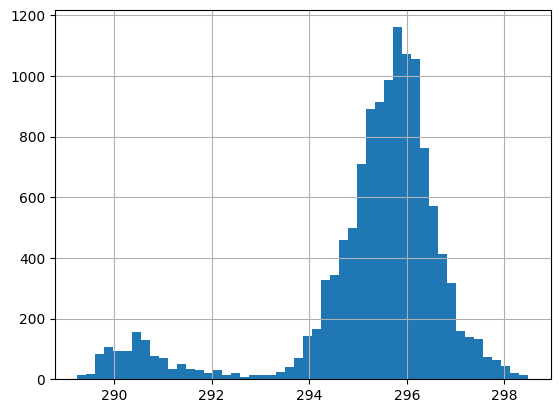

In [56]:
bio['TS'].hist(bins=50)


In [57]:

ta_cols = [x for x in bio.columns if 'TA_' in x]
rh_cols = [x for x in bio.columns if 'RH_' in x]
bio[ta_cols + rh_cols].tail(20)


,TA_1_1_1,TA_2_1_1,RH_1_1_1,RH_2_1_1
2023-11-15 13:30:00,294.627,294.341,100.338,97.1039
2023-11-15 14:00:00,295.033,294.791,100.395,94.7727
2023-11-15 14:30:00,294.471,293.959,100.236,98.1274
2023-11-15 15:00:00,294.160,293.763,100.411,98.1645
2023-11-15 15:30:00,294.056,293.739,100.397,98.9123
2023-11-15 16:00:00,294.074,293.805,100.407,98.7880
2023-11-15 16:30:00,293.985,293.820,100.406,98.6399
2023-11-15 17:00:00,294.050,293.784,100.396,98.8269
2023-11-15 17:30:00,293.787,293.649,100.408,98.8811
2023-11-15 18:00:00,293.645,293.477,100.404,99.3892


In [58]:

# bio_reddy_cols = ['SWIN_1_1_1', 'TA_2_1_1', 'TS', 'RH_2_1_1']
if 'KCR'.lower() in folder.lower():
    upper_ta_suff = '_2_1_1' 
if 'Bidup'.lower() in folder.lower() or 'Bdp'.lower() in folder.lower():
    upper_ta_suff = '_1_1_1_36' 
    

upper_ta = [x for x in bio.columns if (upper_ta_suff in x) and ('ta' in x.lower())][0]
upper_ta


'TA_2_1_1'

In [59]:
upper_rh = [x for x in bio.columns if (upper_ta_suff in x) and ('rh' in x.lower())][0]
take_from_bio = [upper_ta] + [upper_rh] + ['TS']
rg_cols = [x for x in bio.columns if (('rg_' in x.lower()) or ('swin_' in x.lower()) )]
rg_col = rg_cols[0]
rg_col


'RG_1_1_1'

In [60]:
take_from_bio.append(rg_col)
take_from_bio

['TA_2_1_1', 'RH_2_1_1', 'TS', 'RG_1_1_1']

In [61]:
units[rg_col]

0      [W/m^2]
2        W/m^2
pic    W/$m^2$
Name: RG_1_1_1, dtype: object

------------------------------

# add daytime column


In [62]:
sunstate = pd.read_csv(r"D:\data_process\KCR_sunrise_sunset.csv", sep=';', skiprows=1, usecols=[0, 1,3], names=['date', 'sunrise', 'sunset'],)
sunstate

,date,sunrise,sunset
0,1.05,05:24,18:03
1,2.05,05:24,18:03
2,3.05,05:23,18:04
3,4.05,05:23,18:04
4,5.05,05:23,18:04
...,...,...,...
561,12.11,05:46,17:16
562,13.11,05:46,17:15
563,14.11,05:47,17:15
564,15.11,05:47,17:15


In [63]:
year_markers = sunstate['date'][sunstate['date'] > 2021]

In [64]:
year_markers.index[0]

245

In [65]:
i0 = sunstate.index[0]
year0 = year_markers[year_markers.index[0]]-1
for ind in year_markers.index:
    print(ind, year_markers[ind])
    
    sunstate.loc[i0:(ind-1), 'date'] = pd.to_datetime ({'year':year0, 'day' : (sunstate.loc[i0:(ind-1), 'date'].apply(lambda x: math.modf(x)[1])).round(), 'month' : (sunstate.loc[i0:(ind-1), 'date'].apply(lambda x: math.modf(x)[0]*100)).round()}, format='')
    i0 = ind + 1
    year0 = year_markers[ind]
    sunstate = sunstate[sunstate.index != ind]
sunstate.loc[i0:, 'date'] = pd.to_datetime({'year':year0, 'day' : (sunstate.loc[i0:, 'date'].apply(lambda x: math.modf(x)[1])).round(), 'month' : (sunstate.loc[i0:, 'date'].apply(lambda x: math.modf(x)[0]*100)).round()}, format='')

245 2023.0


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3352735143.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '<DatetimeArray>
['2022-05-01 00:00:00', '2022-05-02 00:00:00', '2022-05-03 00:00:00',
 '2022-05-04 00:00:00', '2022-05-05 00:00:00', '2022-05-06 00:00:00',
 '2022-05-07 00:00:00', '2022-05-08 00:00:00', '2022-05-09 00:00:00',
 '2022-05-10 00:00:00',
 ...
 '2022-12-22 00:00:00', '2022-12-23 00:00:00', '2022-12-24 00:00:00',
 '2022-12-25 00:00:00', '2022-12-26 00:00:00', '2022-12-27 00:00:00',
 '2022-12-28 00:00:00', '2022-12-29 00:00:00', '2022-12-30 00:00:00',
 '2022-12-31 00:00:00']
Length: 245, dtype: datetime64[ns]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  sunstate.loc[i0:(ind-1), 'date'] = pd.to_datetime ({'year':year0, 'day' : (sunstate.loc[i0:(ind-1), 'date'].apply(lambda x: math.modf(x)[1])).round(), 'month' : (sunstate.loc[i0:(ind-1),

In [66]:
sunstate

,date,sunrise,sunset
0,2022-05-01 00:00:00,05:24,18:03
1,2022-05-02 00:00:00,05:24,18:03
2,2022-05-03 00:00:00,05:23,18:04
3,2022-05-04 00:00:00,05:23,18:04
4,2022-05-05 00:00:00,05:23,18:04
...,...,...,...
561,2023-11-12 00:00:00,05:46,17:16
562,2023-11-13 00:00:00,05:46,17:15
563,2023-11-14 00:00:00,05:47,17:15
564,2023-11-15 00:00:00,05:47,17:15


In [67]:
sunstate['sunrise_h'] = sunstate['sunrise'].str[:2].astype(int)
sunstate['sunrise_m'] = sunstate['sunrise'].str[3:].astype(int)

sunstate['sunset_h'] = sunstate['sunset'].str[:2].astype(int)
sunstate['sunset_m'] = sunstate['sunset'].str[3:].astype(int)
sunstate['date'] = pd.to_datetime(sunstate['date']).dt.date
sunstate.reset_index(drop=True, inplace=True)

sunstate

C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\2725422473.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sunstate['sunrise_h'] = sunstate['sunrise'].str[:2].astype(int)
C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\2725422473.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sunstate['sunrise_m'] = sunstate['sunrise'].str[3:].astype(int)
C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\2725422473.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Data

,date,sunrise,sunset,sunrise_h,sunrise_m,sunset_h,sunset_m
0,2022-05-01,05:24,18:03,5,24,18,3
1,2022-05-02,05:24,18:03,5,24,18,3
2,2022-05-03,05:23,18:04,5,23,18,4
3,2022-05-04,05:23,18:04,5,23,18,4
4,2022-05-05,05:23,18:04,5,23,18,4
...,...,...,...,...,...,...,...
560,2023-11-12,05:46,17:16,5,46,17,16
561,2023-11-13,05:46,17:15,5,46,17,15
562,2023-11-14,05:47,17:15,5,47,17,15
563,2023-11-15,05:47,17:15,5,47,17,15


In [68]:
sunstate['date'].isna().sum()

0

In [69]:
def set_daytime(ts):
    day = sunstate[sunstate['date'] == ts.date()]
    sunrise = day.iloc[0, 0] + pd.DateOffset(hour=day.iloc[0, 3], minute=day.iloc[0,4])
    sunset = day.iloc[0, 0] + pd.DateOffset(hour=day.iloc[0, 5], minute=day.iloc[0,6])
    if sunrise + pd.DateOffset(minutes=15) <= ts <= sunset+ pd.DateOffset(minutes=15):
        return 1
    else:
        return 0

-------------------------------------

# полный временной ряд

In [70]:
all_dates = pd.date_range(df.index[0], df.index[-1], freq = pd.Timedelta('30min'))
all_dates = pd.DataFrame(all_dates, index=all_dates)
all_dates

,0
2023-02-24 00:30:00,2023-02-24 00:30:00
2023-02-24 01:00:00,2023-02-24 01:00:00
2023-02-24 01:30:00,2023-02-24 01:30:00
2023-02-24 02:00:00,2023-02-24 02:00:00
2023-02-24 02:30:00,2023-02-24 02:30:00
...,...
2023-11-15 21:00:00,2023-11-15 21:00:00
2023-11-15 21:30:00,2023-11-15 21:30:00
2023-11-15 22:00:00,2023-11-15 22:00:00
2023-11-15 22:30:00,2023-11-15 22:30:00


In [71]:
all_dates.shape, df.shape

((12718, 1), (12718, 142))

In [72]:
all_df = all_dates.merge(df, how='left', left_on=all_dates.index, right_on = df.index)
all_df.index = all_df[0]
all_df = all_df.drop(['key_0', 0], axis=1)
all_df = all_df.merge(bio.iloc[:, 3:], how='left', left_on=all_df.index, right_on = bio.index)
all_df.index = all_df['key_0']
all_df.index.name = 'timestamp'
all_df['daytime2'] = all_df['key_0'].apply(set_daytime)
all_df['period'] = all_df.index.to_period('d').astype(str)

all_df.head(20)

,key_0,filename,date,time,DOY,daytime,file_records,used_records,Tau,qc_Tau,...,SWC_2_1_1,SWC_3_1_1,TA_1_1_1,TA_2_1_1,TS_1_1_1,TS_2_1_1,TS_3_1_1,TS,daytime2,period
timestamp,,,,,,,,,,,,,,,,,,,,,
2023-02-24 00:30:00,2023-02-24 00:30:00,2023-02-24T000000_KTR-AIU-2334.ghg,2023-02-24,00:30,55.020,0.0,18000.0,18000.0,-0.167290,1.0,...,0.283000,0.338000,288.138,287.864,290.463,290.450,290.450,290.454333,0,2023-02-24
2023-02-24 01:00:00,2023-02-24 01:00:00,2023-02-24T003000_KTR-AIU-2334.ghg,2023-02-24,01:00,55.041,0.0,18000.0,18000.0,-0.042600,0.0,...,0.283000,0.338000,287.863,287.625,290.450,290.450,290.450,290.450000,0,2023-02-24
2023-02-24 01:30:00,2023-02-24 01:30:00,2023-02-24T010000_KTR-AIU-2334.ghg,2023-02-24,01:30,55.062,0.0,18000.0,18000.0,-0.172975,0.0,...,0.282733,0.336933,287.786,287.522,290.450,290.450,290.450,290.450000,0,2023-02-24
2023-02-24 02:00:00,2023-02-24 02:00:00,2023-02-24T013000_KTR-AIU-2334.ghg,2023-02-24,02:00,55.083,0.0,18000.0,18000.0,-0.085059,0.0,...,0.281000,0.336000,287.649,287.465,290.450,290.450,290.450,290.450000,0,2023-02-24
2023-02-24 02:30:00,2023-02-24 02:30:00,2023-02-24T020000_KTR-AIU-2334.ghg,2023-02-24,02:30,55.104,0.0,18000.0,18000.0,-0.041798,1.0,...,0.281000,0.336000,287.411,287.194,290.407,290.430,290.440,290.425667,0,2023-02-24
2023-02-24 03:00:00,2023-02-24 03:00:00,2023-02-24T023000_KTR-AIU-2334.ghg,2023-02-24,03:00,55.125,0.0,18000.0,18000.0,-0.033149,1.0,...,0.281000,0.336000,287.114,287.048,290.350,290.377,290.377,290.368000,0,2023-02-24
2023-02-24 03:30:00,2023-02-24 03:30:00,2023-02-24T030000_KTR-AIU-2334.ghg,2023-02-24,03:30,55.145,0.0,18000.0,18000.0,-0.142661,0.0,...,0.280800,0.336000,287.098,287.020,290.270,290.350,290.350,290.323333,0,2023-02-24
2023-02-24 04:00:00,2023-02-24 04:00:00,2023-02-24T033000_KTR-AIU-2334.ghg,2023-02-24,04:00,55.166,0.0,18000.0,18000.0,-0.103434,0.0,...,0.279400,0.335933,287.264,287.090,290.150,290.350,290.350,290.283333,0,2023-02-24
2023-02-24 04:30:00,2023-02-24 04:30:00,2023-02-24T040000_KTR-AIU-2334.ghg,2023-02-24,04:30,55.187,0.0,18000.0,18000.0,-0.135311,0.0,...,0.279000,0.334533,287.365,287.085,290.150,290.350,290.350,290.283333,0,2023-02-24


In [73]:
my_days =pd.pivot_table(all_df, columns=all_df['period'], index=all_df.index.time, values='daytime2')

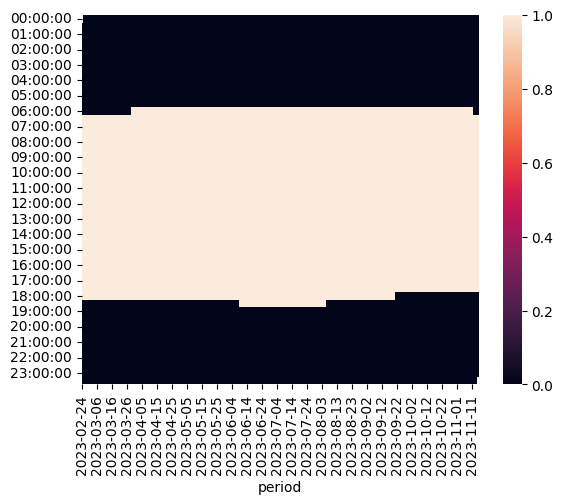

In [74]:
sns.heatmap(my_days);

In [75]:
my_days_0 =pd.pivot_table(all_df, columns=all_df['period'], index=all_df.index.time, values='daytime')

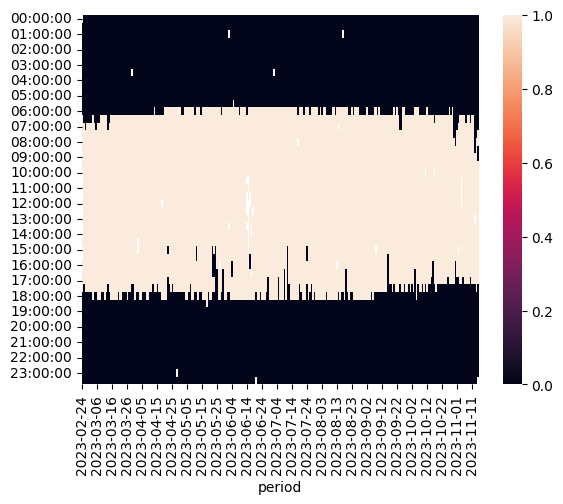

In [76]:
sns.heatmap(my_days_0);

---

# посмотрим потоки


------------------
Despike NEE:
number of null values: 1100, 8.649158672747287 % 
number of null values: 11618, 91.35084132725271 % 
Column NEE has 1304 spikes (11.223962816319505%) from total 11618 records


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3749859875.py:52: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{col} residuals from {part[ts][0]} to {part[ts][-1]}')


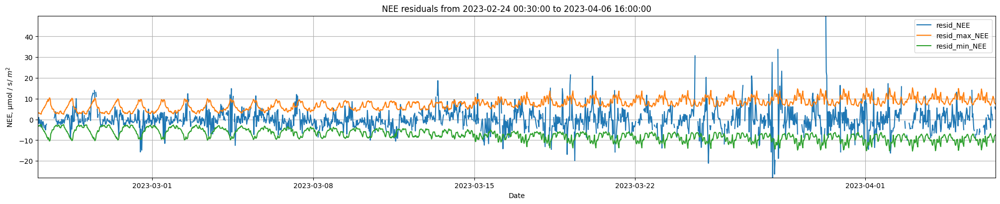

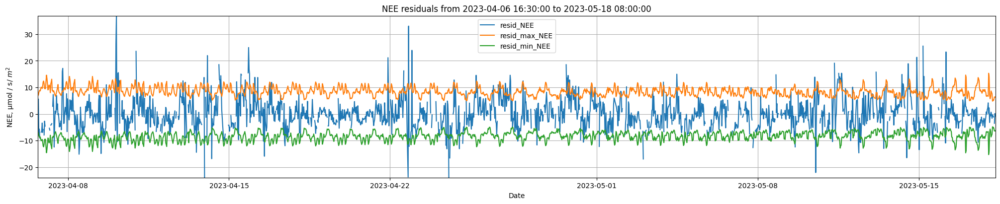

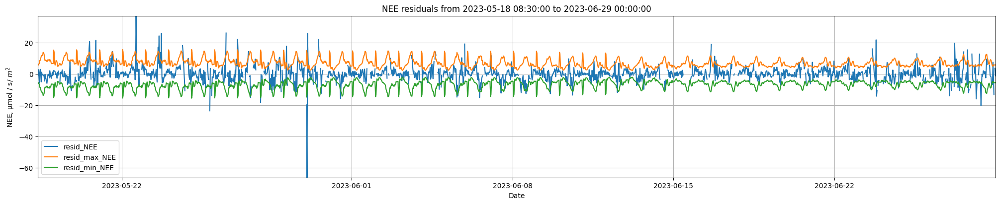

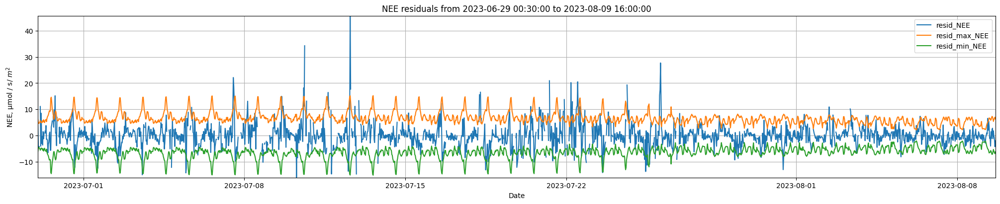

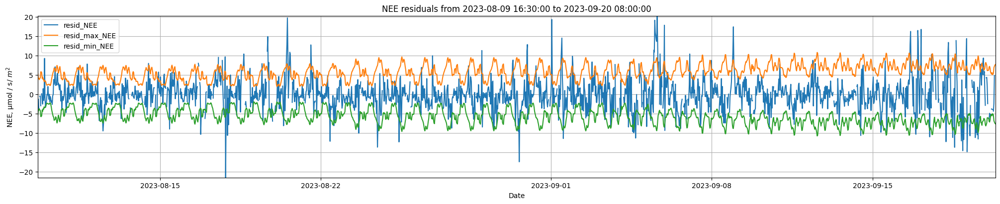

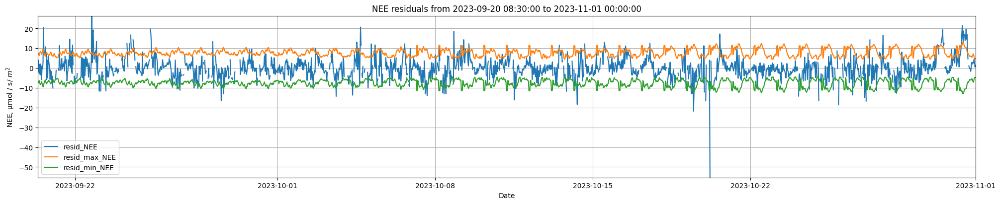

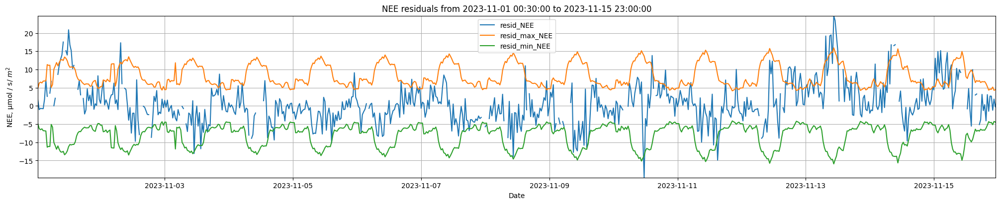


Data NEE with discarded outliers:


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3749859875.py:72: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{col} data from {part[ts][0]} to {part[ts][-1]}')


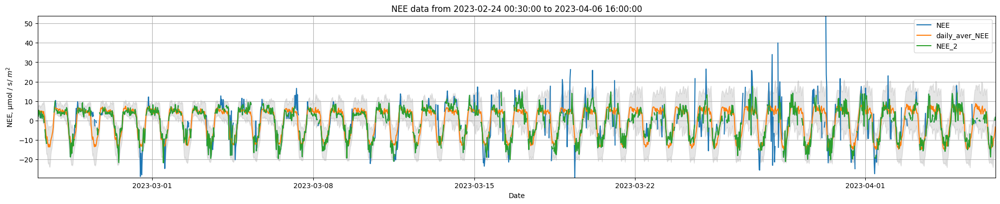

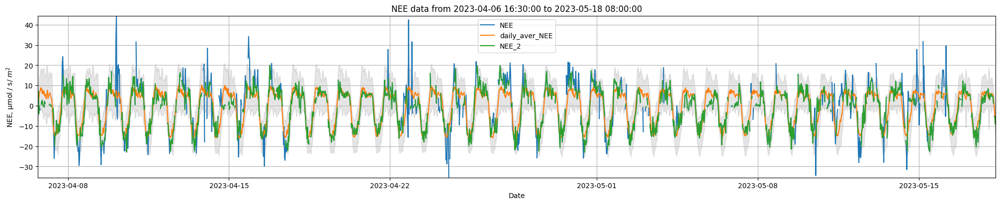

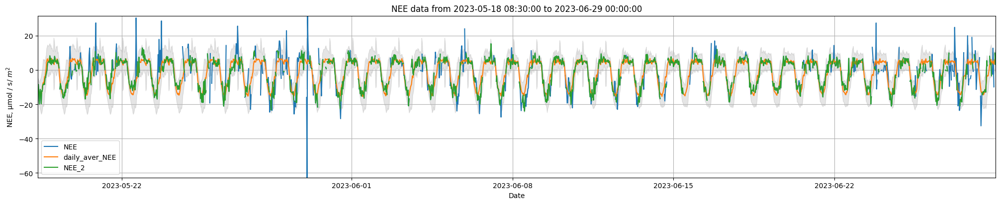

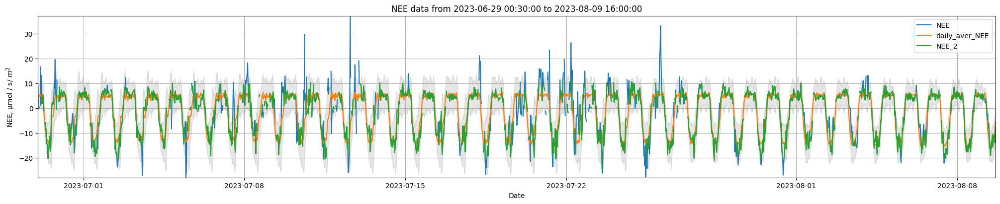

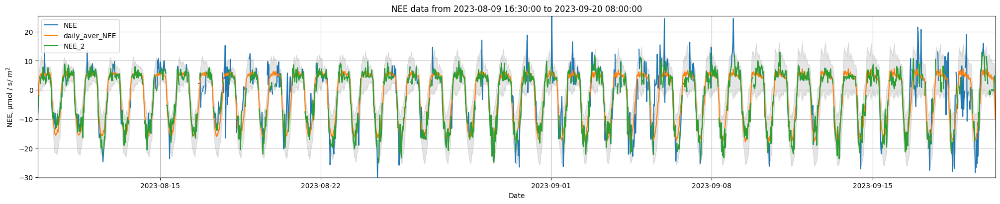

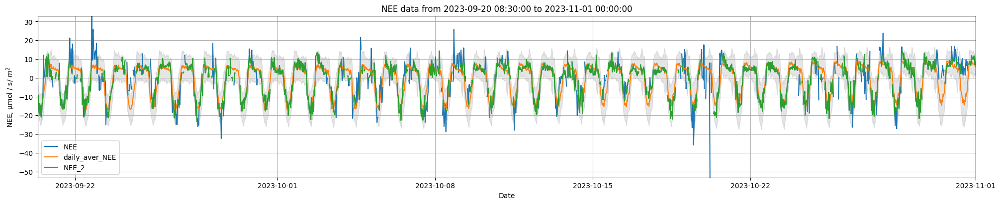

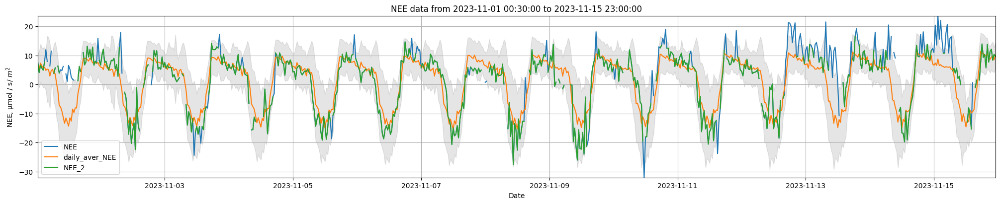

--------------------------

Filling the gaps with size 1-2 values by linear trend:
Number of values filled: 1518
--------------------------------

Fill the gaps with daily average trend


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\369506106.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{fig_col} data from {part[ts_col][0]} to {part[ts_col][-1]}')


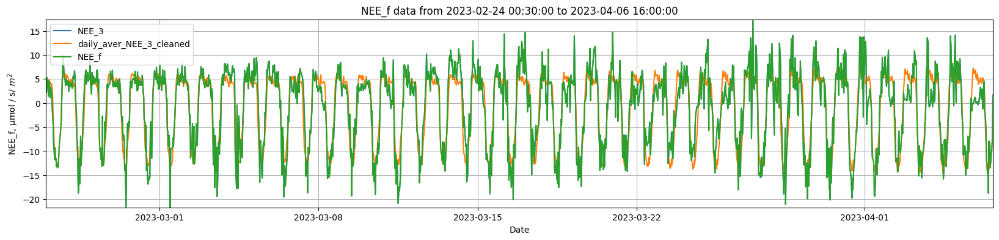

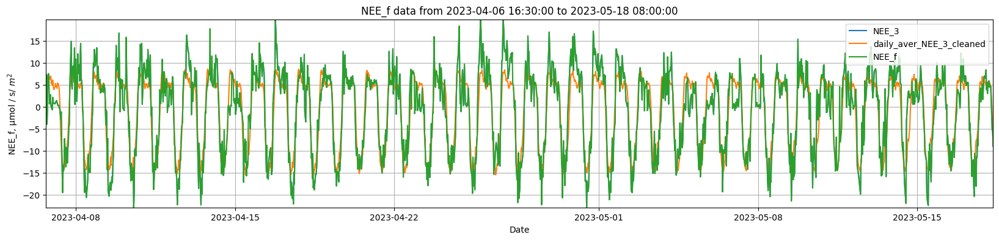

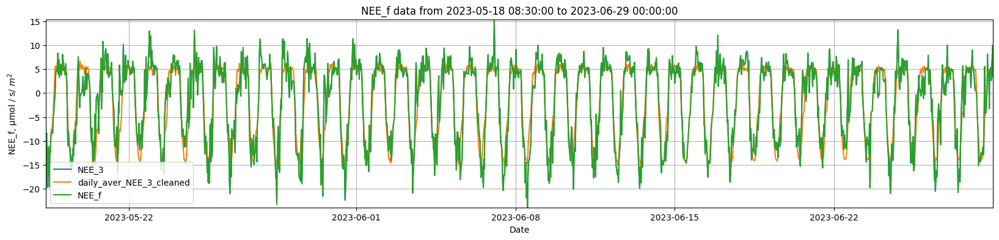

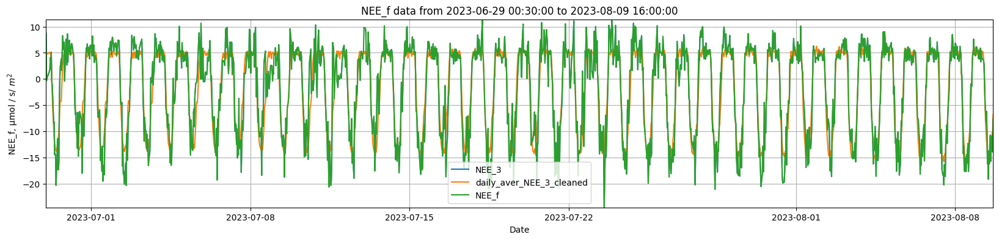

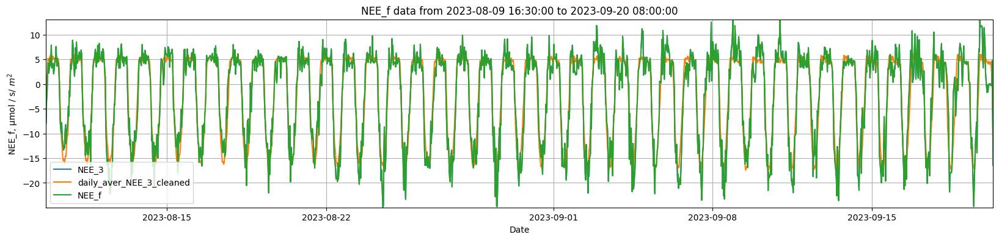

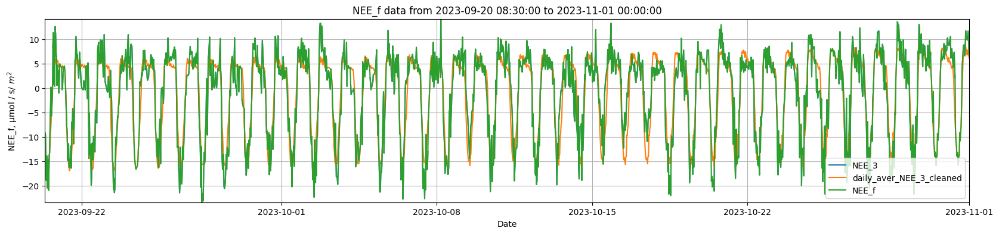

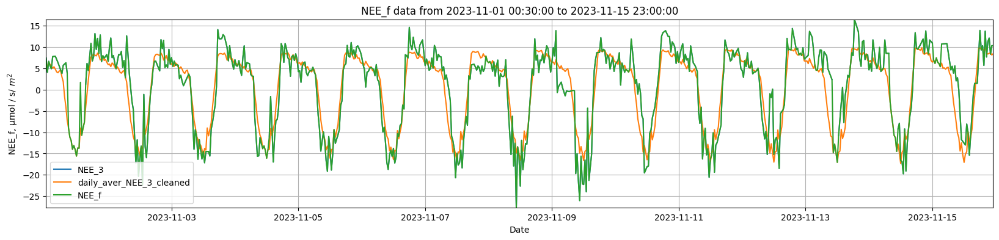

Number of filled values on this step: 886
Number of nan values on this step: 0, 0.0%
----------------------------
----------------------------

------------------
Despike H_qual:
number of null values: 1423, 11.188866173926717 % 
number of null values: 11295, 88.81113382607329 % 
Column H_qual has 1114 spikes (9.862771137671537%) from total 11295 records


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3749859875.py:52: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{col} residuals from {part[ts][0]} to {part[ts][-1]}')


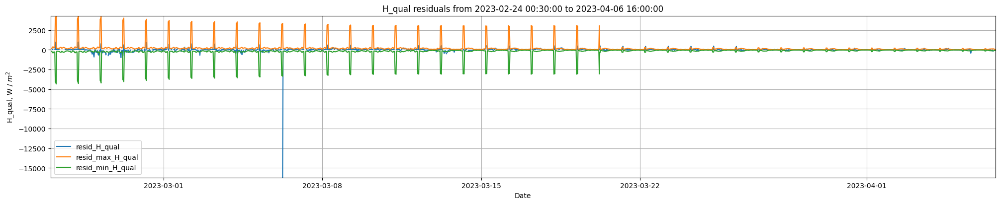

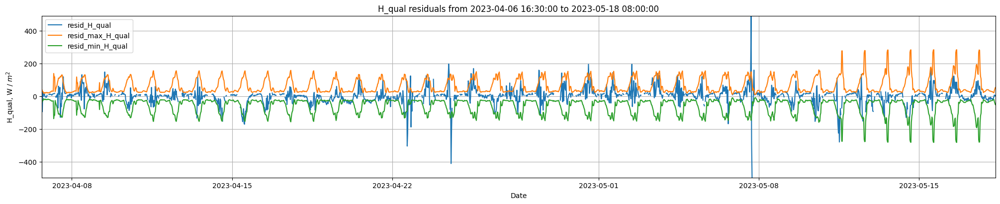

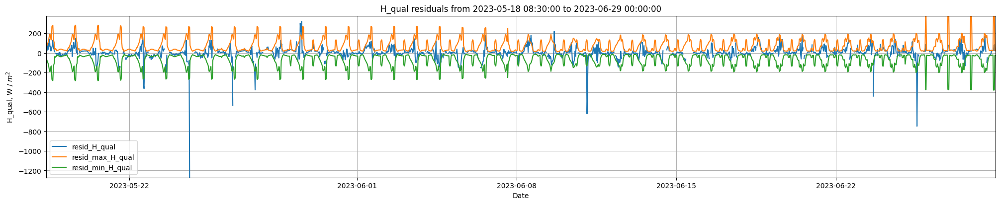

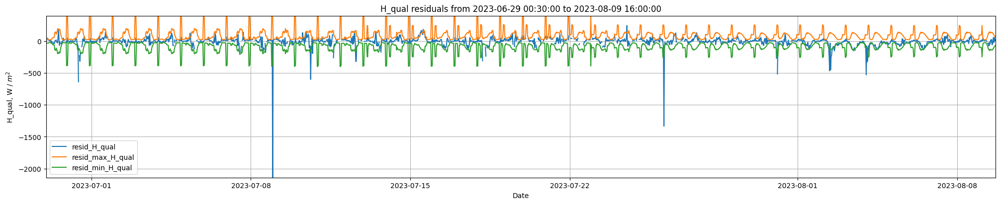

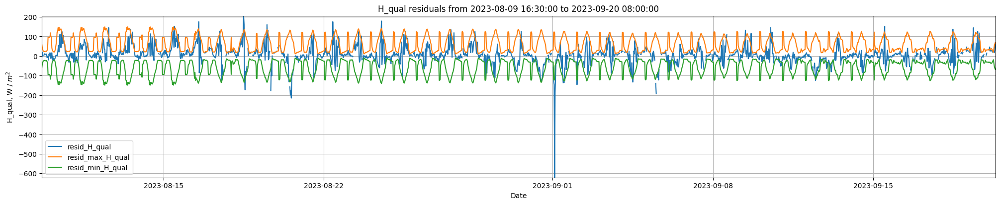

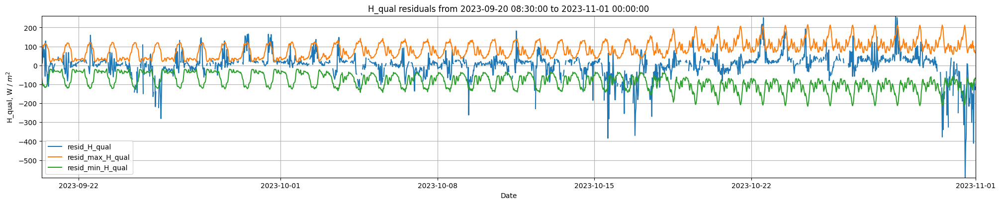

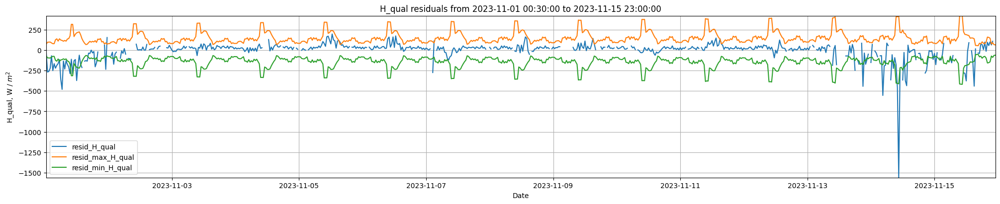


Data H_qual with discarded outliers:


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3749859875.py:72: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{col} data from {part[ts][0]} to {part[ts][-1]}')


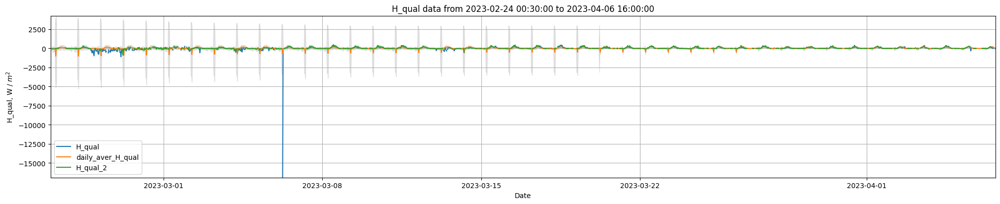

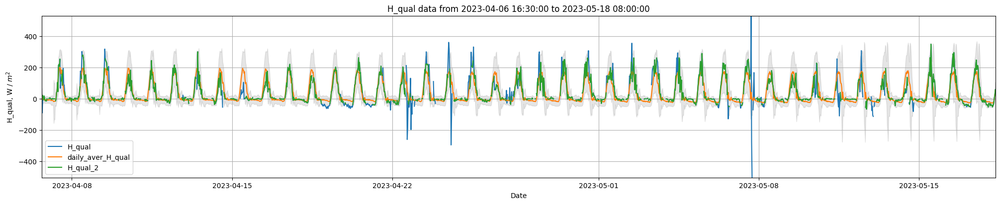

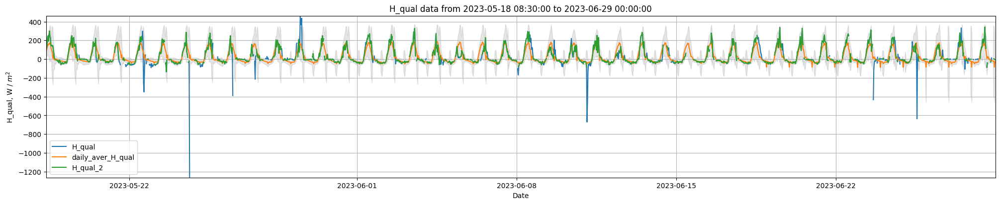

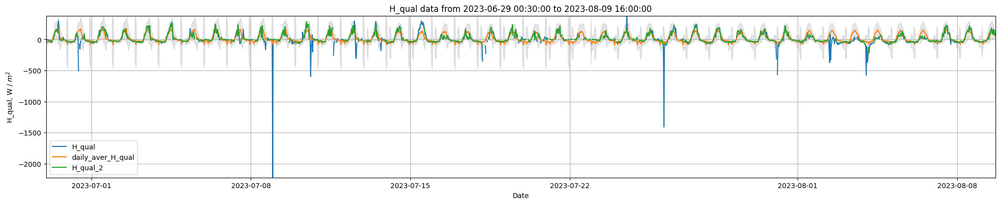

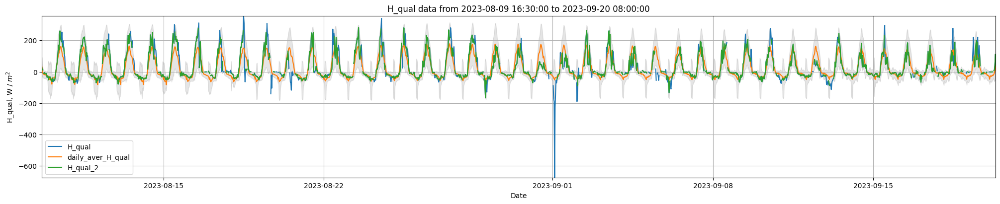

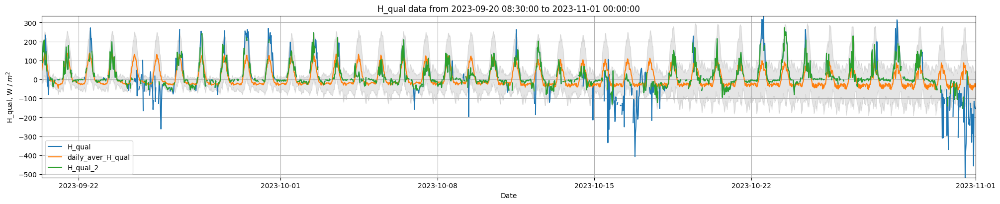

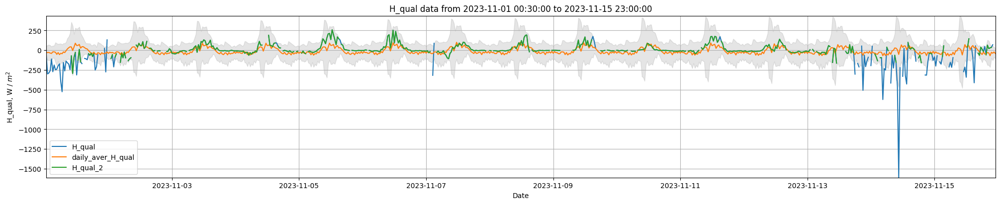

--------------------------

Filling the gaps with size 1-2 values by linear trend:
Number of values filled: 1519
--------------------------------

Fill the gaps with daily average trend


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\369506106.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{fig_col} data from {part[ts_col][0]} to {part[ts_col][-1]}')


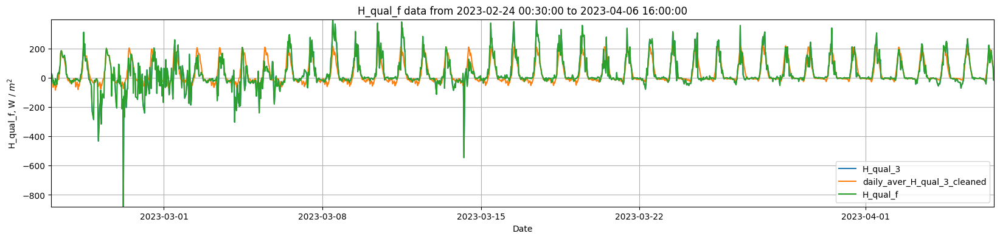

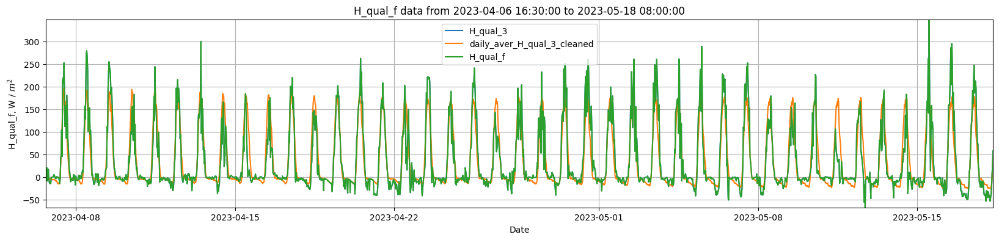

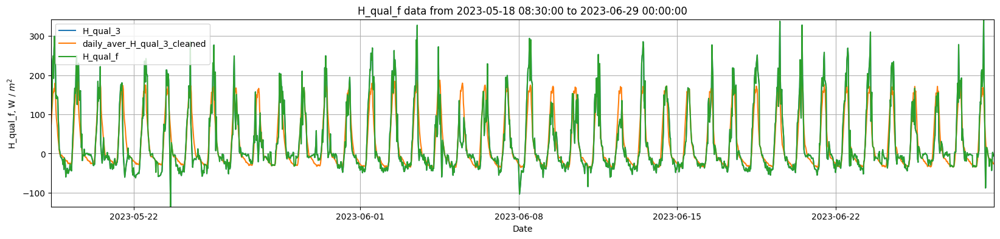

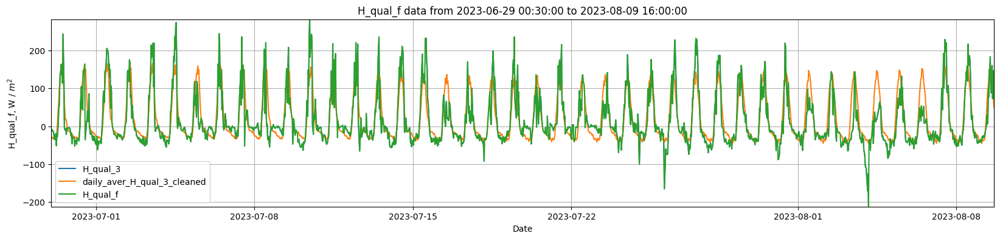

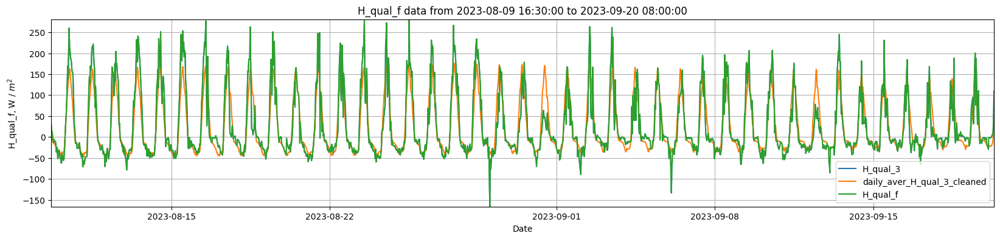

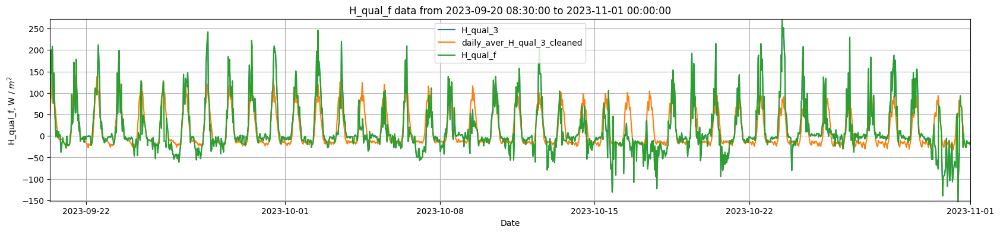

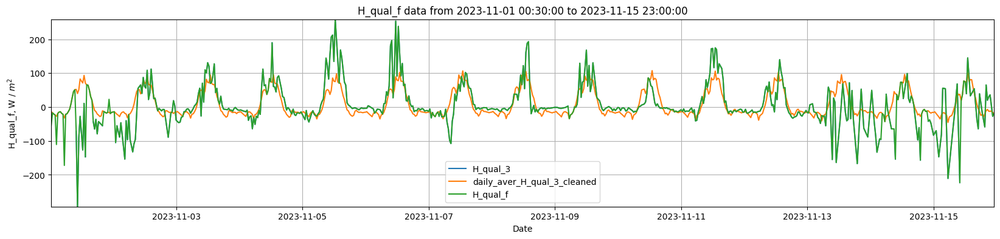

Number of filled values on this step: 1018
Number of nan values on this step: 0, 0.0%
----------------------------
----------------------------

------------------
Despike LE_qual:
number of null values: 2524, 19.845887718194685 % 
number of null values: 10194, 80.15411228180531 % 
Column LE_qual has 970 spikes (9.515401216401804%) from total 10194 records


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3749859875.py:52: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{col} residuals from {part[ts][0]} to {part[ts][-1]}')


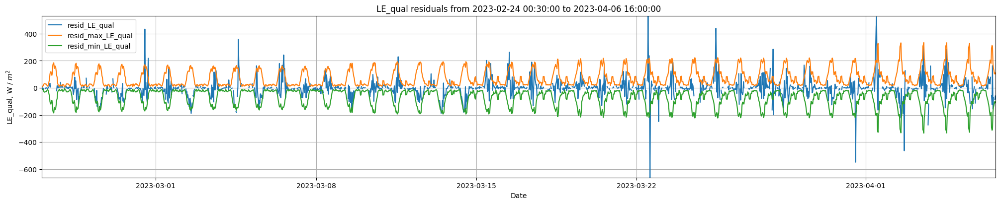

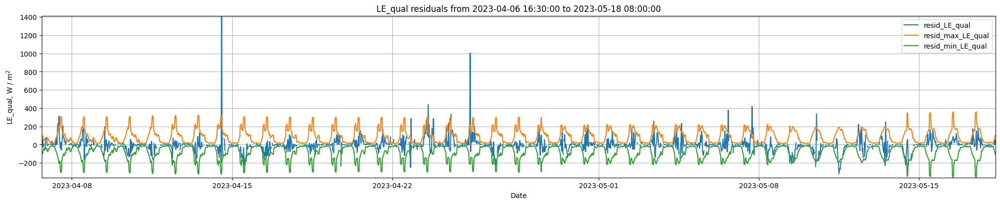

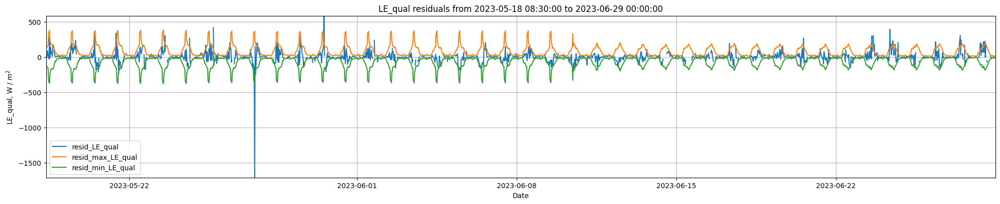

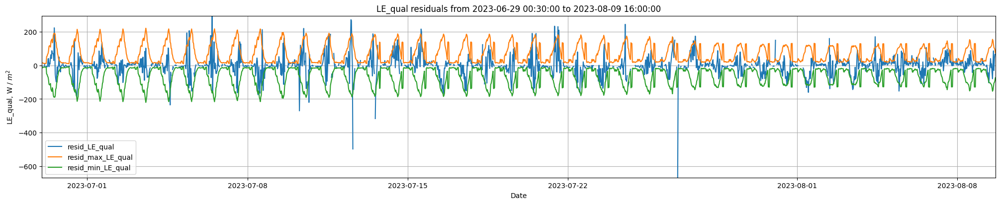

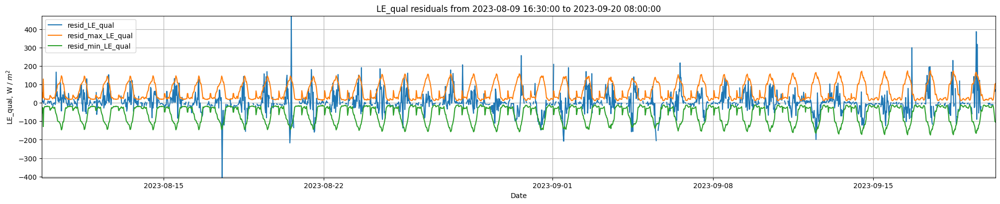

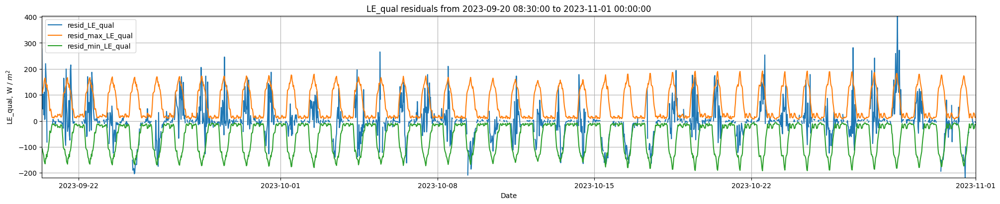

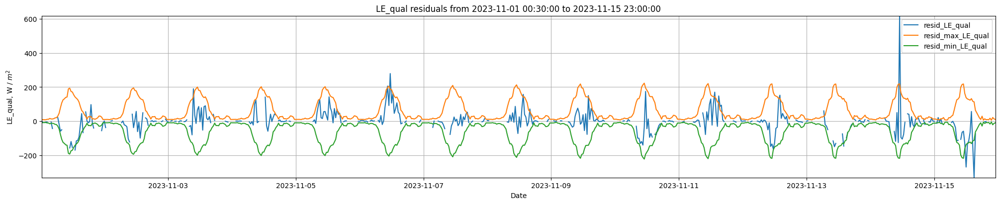


Data LE_qual with discarded outliers:


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3749859875.py:72: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{col} data from {part[ts][0]} to {part[ts][-1]}')


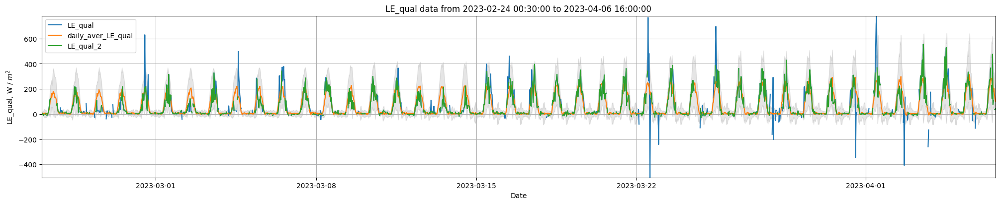

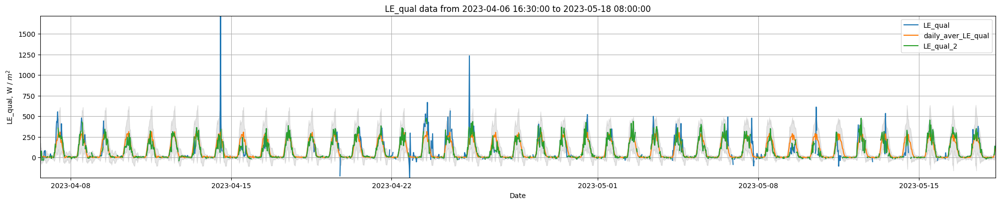

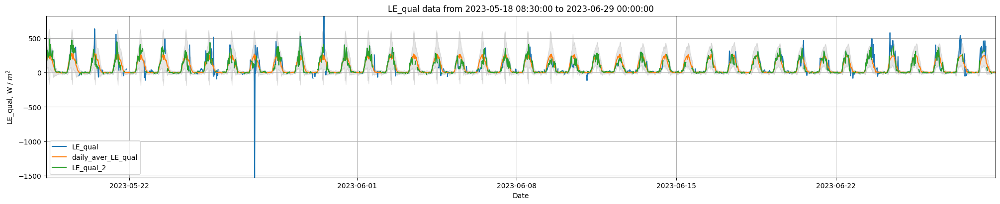

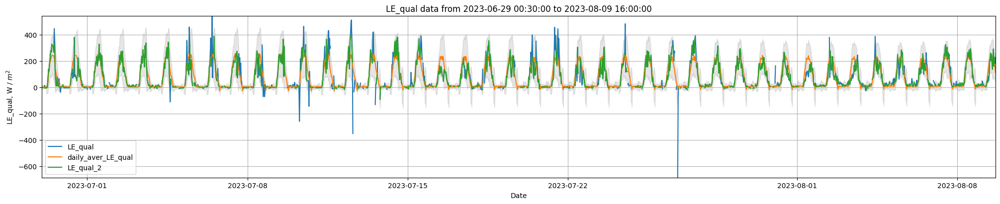

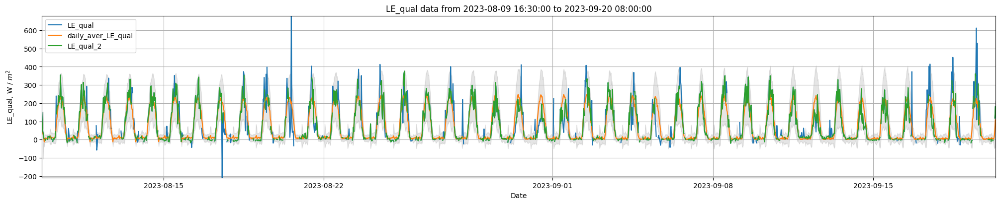

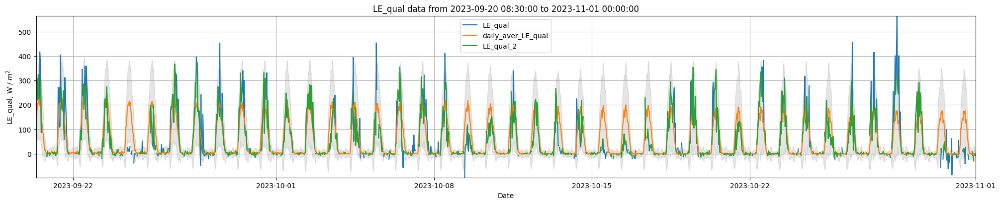

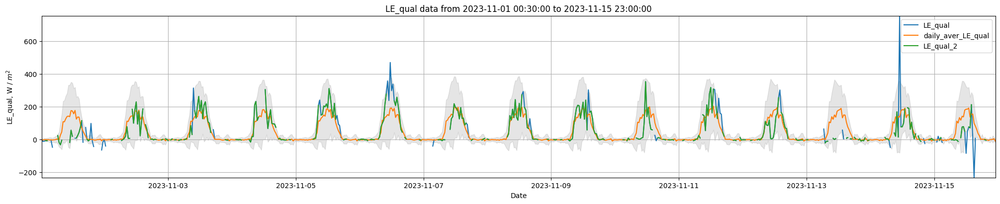

--------------------------

Filling the gaps with size 1-2 values by linear trend:
Number of values filled: 2297
--------------------------------

Fill the gaps with daily average trend


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\369506106.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{fig_col} data from {part[ts_col][0]} to {part[ts_col][-1]}')


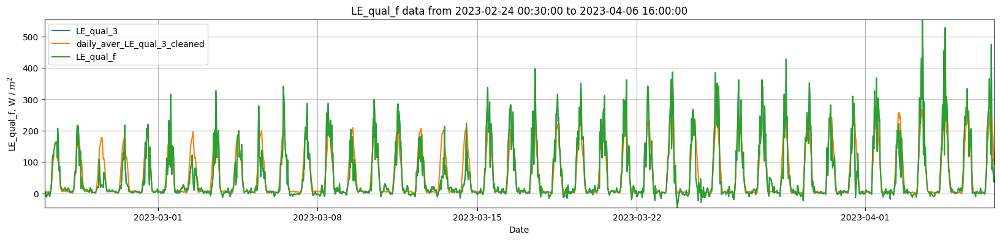

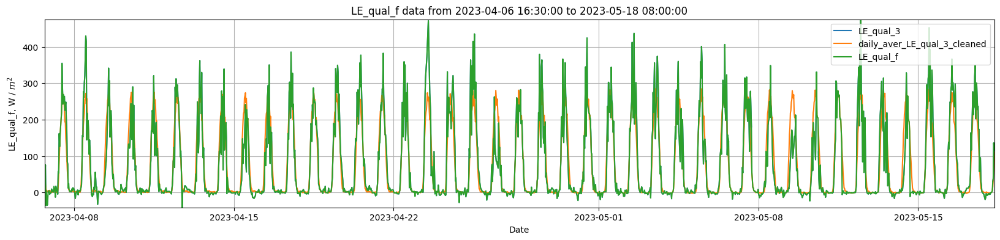

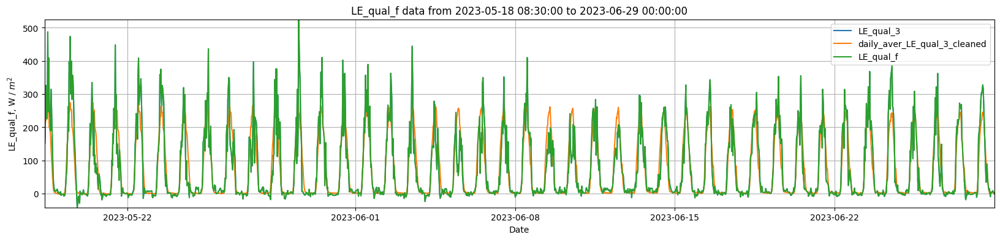

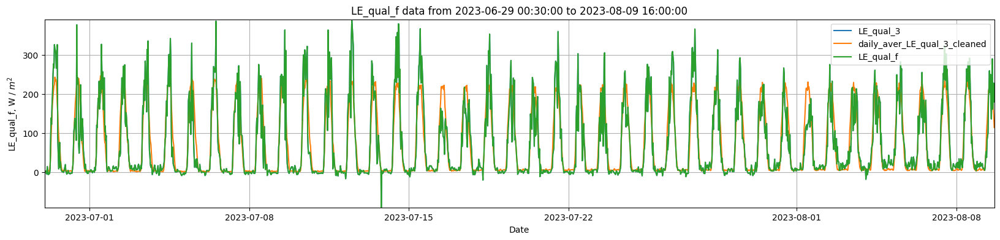

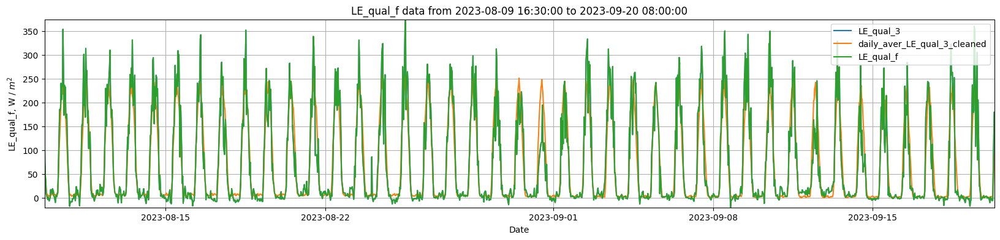

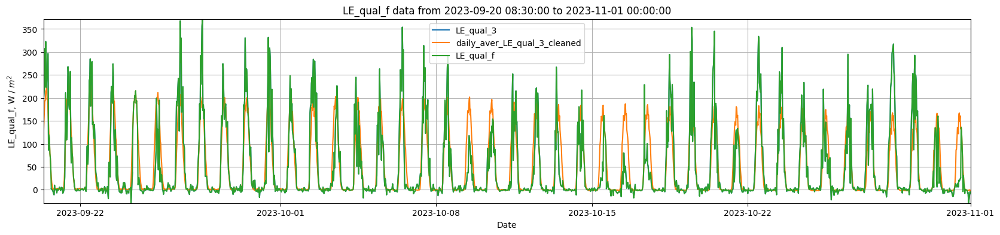

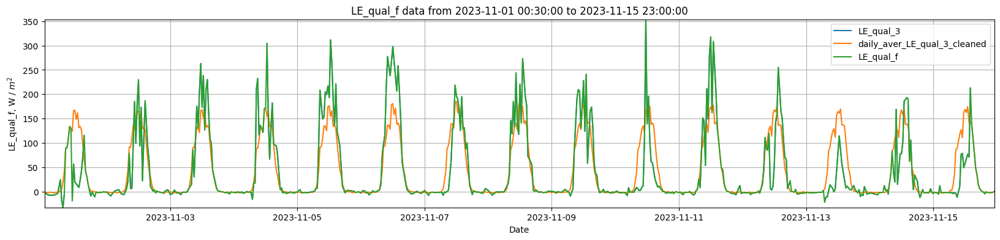

Number of filled values on this step: 1197
Number of nan values on this step: 0, 0.0%
----------------------------
----------------------------



In [77]:
make_good_data(all_df, 'key_0')

C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\369506106.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{fig_col} data from {part[ts_col][0]} to {part[ts_col][-1]}')


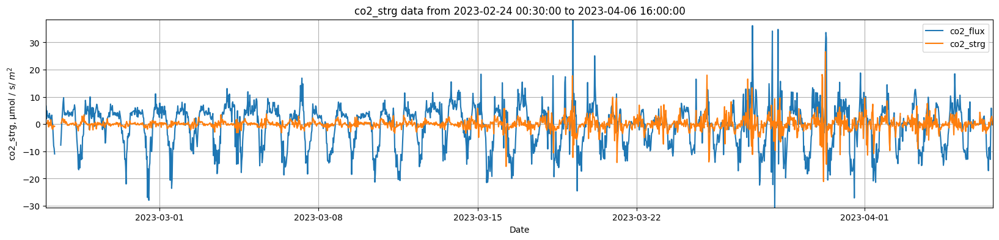

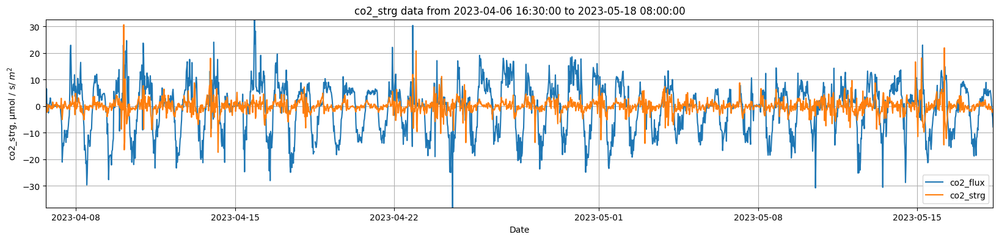

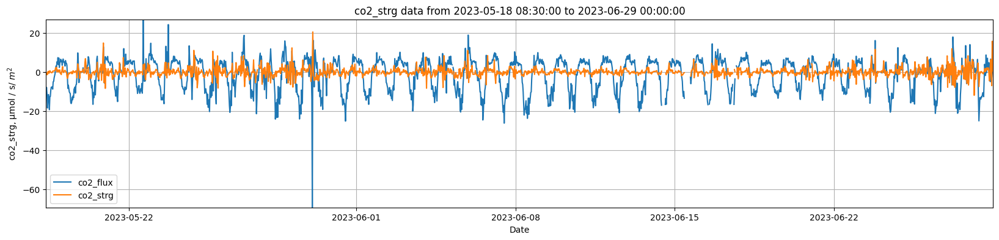

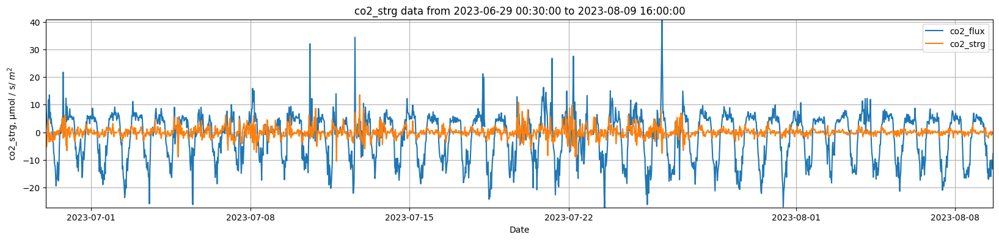

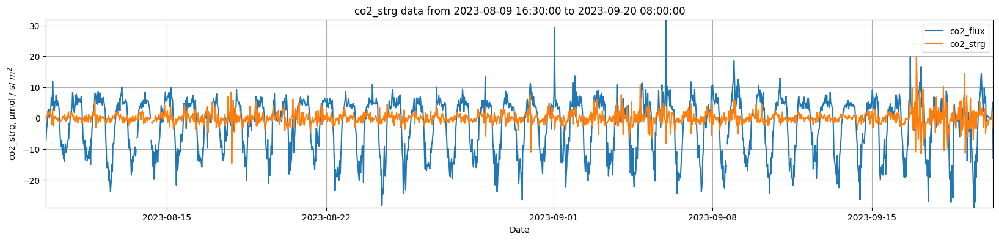

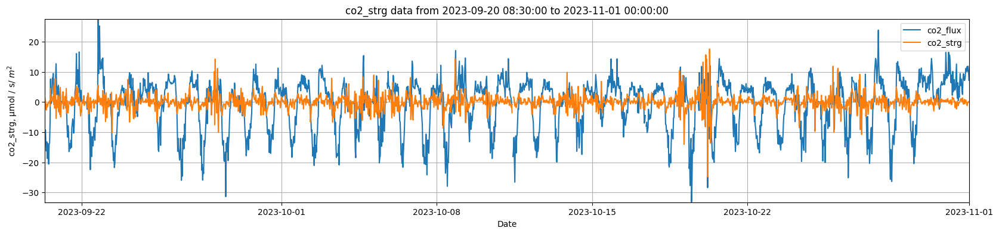

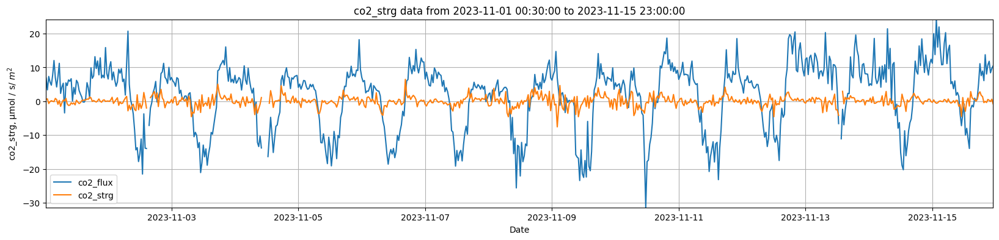

In [78]:
look_at_data(all_df, 'key_0', 'co2_flux', 'co2_strg')

---

# Формирование датасета для загрузки в ReddyProc

In [79]:
fluxes_to_rp = ['NEE_3', 'LE_qual_3', 'H_qual_3']
fluxes_to_rp

['NEE_3', 'LE_qual_3', 'H_qual_3']

In [80]:
reddy_cols = ['key_0', 'date',
 'time',
 'daytime2',
 'DOY'] + fluxes_to_rp + [rg_col, upper_ta, 'TS', upper_rh, 'RH', 'VPD', 'u*']
reddy_cols

['key_0',
 'date',
 'time',
 'daytime2',
 'DOY',
 'NEE_3',
 'LE_qual_3',
 'H_qual_3',
 'RG_1_1_1',
 'TA_2_1_1',
 'TS',
 'RH_2_1_1',
 'RH',
 'VPD',
 'u*']

In [81]:
re_df = all_df[reddy_cols]
re_df

,key_0,date,time,daytime2,DOY,NEE_3,LE_qual_3,H_qual_3,RG_1_1_1,TA_2_1_1,TS,RH_2_1_1,RH,VPD,u*
timestamp,,,,,,,,,,,,,,,
2023-02-24 00:30:00,2023-02-24 00:30:00,2023-02-24,00:30,0,55.020,2.255831,-1.78824,27.204400,-0.000212,287.864,290.454333,100.0340,100.0340,-0.560241,0.394781
2023-02-24 01:00:00,2023-02-24 01:00:00,2023-02-24,01:00,0,55.041,2.255831,-1.78824,27.204400,-0.000246,287.625,290.450000,100.0080,100.0080,-0.138165,0.199142
2023-02-24 01:30:00,2023-02-24 01:30:00,2023-02-24,01:30,0,55.062,5.261486,3.16601,14.277400,-0.000205,287.522,290.450000,99.9898,99.9898,0.165762,0.401238
2023-02-24 02:00:00,2023-02-24 02:00:00,2023-02-24,02:00,0,55.083,3.389462,-1.56986,-11.578550,-0.000389,287.465,290.450000,100.0310,100.0310,-0.505584,0.281365
2023-02-24 02:30:00,2023-02-24 02:30:00,2023-02-24,02:30,0,55.104,4.574660,-11.67740,-37.434500,-0.000192,287.194,290.425667,100.0430,100.0430,-0.694551,0.197168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-15 21:00:00,2023-11-15 21:00:00,2023-11-15,21:00,0,319.875,11.296763,NaN,30.075600,-0.001040,293.279,294.383333,100.1310,100.1310,-3.080000,0.367522
2023-11-15 21:30:00,2023-11-15 21:30:00,2023-11-15,21:30,0,319.896,12.119531,NaN,35.893900,-0.001216,293.313,294.383333,100.1550,100.1550,-3.642070,0.372623
2023-11-15 22:00:00,2023-11-15 22:00:00,2023-11-15,22:00,0,319.917,8.334901,NaN,4.317233,-0.001252,293.313,294.383333,100.1670,100.1670,-3.926310,0.438243


In [82]:
re_df[(re_df['RH']!=re_df[upper_rh]) & (re_df['RH'].notna())]

,key_0,date,time,daytime2,DOY,NEE_3,LE_qual_3,H_qual_3,RG_1_1_1,TA_2_1_1,TS,RH_2_1_1,RH,VPD,u*
timestamp,,,,,,,,,,,,,,,
2023-06-14 13:00:00,2023-06-14 13:00:00,2023-06-14,13:00,1,165.542,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64.1625,1186.62,1.457030
2023-06-15 15:30:00,2023-06-15 15:30:00,2023-06-15,15:30,1,166.646,NaN,113.6380,28.8149,NaN,NaN,NaN,NaN,66.9677,1129.77,0.511918
2023-06-17 13:00:00,2023-06-17 13:00:00,2023-06-17,13:00,1,168.542,-7.315948,115.5590,153.0930,NaN,NaN,NaN,NaN,60.1761,1406.59,0.633878
2023-06-17 15:30:00,2023-06-17 15:30:00,2023-06-17,15:30,1,168.646,-3.538931,82.3295,-15.1730,NaN,NaN,NaN,NaN,58.8735,1469.21,0.513670


In [83]:
re_df.loc[:, upper_rh] = re_df[upper_rh].fillna(re_df['RH'])

In [84]:
re_df[re_df['RH'].isna()].shape, re_df[re_df[upper_rh].isna()].shape

((59, 15), (18, 15))

In [85]:
re_df.loc[:, 'Hour'] = re_df.index.hour + re_df.index.minute / 60

C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\793056488.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  re_df.loc[:, 'Hour'] = re_df.index.hour + re_df.index.minute / 60


In [86]:
re_df[['Hour']]

,Hour
timestamp,
2023-02-24 00:30:00,0.5
2023-02-24 01:00:00,1.0
2023-02-24 01:30:00,1.5
2023-02-24 02:00:00,2.0
2023-02-24 02:30:00,2.5
...,...
2023-11-15 21:00:00,21.0
2023-11-15 21:30:00,21.5
2023-11-15 22:00:00,22.0


In [87]:
(re_df.index[-1] - re_df.index[0]) / pd.Timedelta('30min')

12717.0

In [88]:
re_df[['Hour']].isna().sum()

Hour    0
dtype: int64

In [89]:
re_df.loc[:, 'DoY'] = re_df.index.day_of_year

C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\1006732973.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  re_df.loc[:, 'DoY'] = re_df.index.day_of_year


In [90]:
re_df[['DOY', 'DoY']]

,DOY,DoY
timestamp,,
2023-02-24 00:30:00,55.020,55
2023-02-24 01:00:00,55.041,55
2023-02-24 01:30:00,55.062,55
2023-02-24 02:00:00,55.083,55
2023-02-24 02:30:00,55.104,55
...,...,...
2023-11-15 21:00:00,319.875,319
2023-11-15 21:30:00,319.896,319
2023-11-15 22:00:00,319.917,319


In [91]:
re_df.loc[:, []]

""
timestamp
2023-02-24 00:30:00
2023-02-24 01:00:00
2023-02-24 01:30:00
2023-02-24 02:00:00
2023-02-24 02:30:00
...
2023-11-15 21:00:00
2023-11-15 21:30:00
2023-11-15 22:00:00


In [92]:
re_df.loc[:, 'Year'] = re_df.index.year

C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\2958180638.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  re_df.loc[:, 'Year'] = re_df.index.year


In [93]:
final_cols = 'Year	DoY	Hour	NEE	LE	H	Rg	Tair	Tsoil	rH	VPD	Ustar'.split('\t')
final_cols

['Year',
 'DoY',
 'Hour',
 'NEE',
 'LE',
 'H',
 'Rg',
 'Tair',
 'Tsoil',
 'rH',
 'VPD',
 'Ustar']

In [94]:
list(re_df.columns)

['key_0',
 'date',
 'time',
 'daytime2',
 'DOY',
 'NEE_3',
 'LE_qual_3',
 'H_qual_3',
 'RG_1_1_1',
 'TA_2_1_1',
 'TS',
 'RH_2_1_1',
 'RH',
 'VPD',
 'u*',
 'Hour',
 'DoY',
 'Year']

In [95]:
reddy = re_df[['Year', 'DoY', 'Hour', 'NEE_3', 'LE_qual_3', 'H_qual_3', rg_col, upper_ta, 'TS', upper_rh, 'VPD', 'u*']]
reddy.reset_index(inplace=True, drop=True)
reddy

,Year,DoY,Hour,NEE_3,LE_qual_3,H_qual_3,RG_1_1_1,TA_2_1_1,TS,RH_2_1_1,VPD,u*
0,2023,55,0.5,2.255831,-1.78824,27.204400,-0.000212,287.864,290.454333,100.0340,-0.560241,0.394781
1,2023,55,1.0,2.255831,-1.78824,27.204400,-0.000246,287.625,290.450000,100.0080,-0.138165,0.199142
2,2023,55,1.5,5.261486,3.16601,14.277400,-0.000205,287.522,290.450000,99.9898,0.165762,0.401238
3,2023,55,2.0,3.389462,-1.56986,-11.578550,-0.000389,287.465,290.450000,100.0310,-0.505584,0.281365
4,2023,55,2.5,4.574660,-11.67740,-37.434500,-0.000192,287.194,290.425667,100.0430,-0.694551,0.197168
...,...,...,...,...,...,...,...,...,...,...,...,...
12713,2023,319,21.0,11.296763,NaN,30.075600,-0.001040,293.279,294.383333,100.1310,-3.080000,0.367522
12714,2023,319,21.5,12.119531,NaN,35.893900,-0.001216,293.313,294.383333,100.1550,-3.642070,0.372623
12715,2023,319,22.0,8.334901,NaN,4.317233,-0.001252,293.313,294.383333,100.1670,-3.926310,0.438243
12716,2023,319,22.5,10.328349,NaN,-27.259433,-0.001146,293.331,294.381000,100.1900,-4.469770,0.563896


In [96]:
reddy.columns = final_cols
reddy.loc[:, ['Tair', 'Tsoil']] = reddy[['Tair', 'Tsoil']] - 273.15
reddy.loc[:, reddy.columns[3:]] = reddy[reddy.columns[3:]].round(2)


In [97]:
reddy.loc[reddy['rH'] > 100, 'rH'] = 100
reddy.loc[:, 'VPD'] = (reddy['VPD'] / 100).round(2)
reddy.loc[reddy['VPD'] <= 0, 'VPD'] = 0
reddy.loc[reddy['Rg'] <= 0, 'Rg'] = 0
reddy

,Year,DoY,Hour,NEE,LE,H,Rg,Tair,Tsoil,rH,VPD,Ustar
0,2023,55,0.5,2.26,-1.79,27.20,0.0,14.71,17.30,100.00,0.0,0.39
1,2023,55,1.0,2.26,-1.79,27.20,0.0,14.48,17.30,100.00,0.0,0.20
2,2023,55,1.5,5.26,3.17,14.28,0.0,14.37,17.30,99.99,0.0,0.40
3,2023,55,2.0,3.39,-1.57,-11.58,0.0,14.31,17.30,100.00,0.0,0.28
4,2023,55,2.5,4.57,-11.68,-37.43,0.0,14.04,17.28,100.00,0.0,0.20
...,...,...,...,...,...,...,...,...,...,...,...,...
12713,2023,319,21.0,11.30,NaN,30.08,0.0,20.13,21.23,100.00,0.0,0.37
12714,2023,319,21.5,12.12,NaN,35.89,0.0,20.16,21.23,100.00,0.0,0.37
12715,2023,319,22.0,8.33,NaN,4.32,0.0,20.16,21.23,100.00,0.0,0.44
12716,2023,319,22.5,10.33,NaN,-27.26,0.0,20.18,21.23,100.00,0.0,0.56


In [98]:
final_units = '-	-	-	umolm-2s-1	Wm-2	Wm-2	Wm-2	degC	degC	%	hPa	ms-1'.split('\t')
reddy_u = pd.DataFrame({ x:[y] for x, y in zip( reddy.columns, final_units)})
reddy_u

,Year,DoY,Hour,NEE,LE,H,Rg,Tair,Tsoil,rH,VPD,Ustar
0,-,-,-,umolm-2s-1,Wm-2,Wm-2,Wm-2,degC,degC,%,hPa,ms-1


In [99]:
reddy = pd.concat([reddy_u, reddy])
reddy

,Year,DoY,Hour,NEE,LE,H,Rg,Tair,Tsoil,rH,VPD,Ustar
0,-,-,-,umolm-2s-1,Wm-2,Wm-2,Wm-2,degC,degC,%,hPa,ms-1
0,2023,55,0.5,2.26,-1.79,27.2,0.0,14.71,17.3,100.0,0.0,0.39
1,2023,55,1.0,2.26,-1.79,27.2,0.0,14.48,17.3,100.0,0.0,0.2
2,2023,55,1.5,5.26,3.17,14.28,0.0,14.37,17.3,99.99,0.0,0.4
3,2023,55,2.0,3.39,-1.57,-11.58,0.0,14.31,17.3,100.0,0.0,0.28
...,...,...,...,...,...,...,...,...,...,...,...,...
12713,2023,319,21.0,11.3,NaN,30.08,0.0,20.13,21.23,100.0,0.0,0.37
12714,2023,319,21.5,12.12,NaN,35.89,0.0,20.16,21.23,100.0,0.0,0.37
12715,2023,319,22.0,8.33,NaN,4.32,0.0,20.16,21.23,100.0,0.0,0.44
12716,2023,319,22.5,10.33,NaN,-27.26,0.0,20.18,21.23,100.0,0.0,0.56


In [100]:
reddy = reddy.fillna(-9999)
reddy

,Year,DoY,Hour,NEE,LE,H,Rg,Tair,Tsoil,rH,VPD,Ustar
0,-,-,-,umolm-2s-1,Wm-2,Wm-2,Wm-2,degC,degC,%,hPa,ms-1
0,2023,55,0.5,2.26,-1.79,27.2,0.0,14.71,17.3,100.0,0.0,0.39
1,2023,55,1.0,2.26,-1.79,27.2,0.0,14.48,17.3,100.0,0.0,0.2
2,2023,55,1.5,5.26,3.17,14.28,0.0,14.37,17.3,99.99,0.0,0.4
3,2023,55,2.0,3.39,-1.57,-11.58,0.0,14.31,17.3,100.0,0.0,0.28
...,...,...,...,...,...,...,...,...,...,...,...,...
12713,2023,319,21.0,11.3,-9999,30.08,0.0,20.13,21.23,100.0,0.0,0.37
12714,2023,319,21.5,12.12,-9999,35.89,0.0,20.16,21.23,100.0,0.0,0.37
12715,2023,319,22.0,8.33,-9999,4.32,0.0,20.16,21.23,100.0,0.0,0.44
12716,2023,319,22.5,10.33,-9999,-27.26,0.0,20.18,21.23,100.0,0.0,0.56


In [101]:
now = time.strftime('%Y_%m_%d_%H_%M_%S', time.localtime())
filename = f'KCR_reddy_{now}.txt'
reddy.to_csv(filename, sep = '\t', index=False)

---

---